In [3]:
import aopy
from aopy.data import db
from aopy.analysis import accllr
import os
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
import h5py
import traceback
from scipy.stats import zscore
import datetime
from tqdm.auto import tqdm
from IPython.display import display, Markdown
import pandas as pd
import seaborn as sns
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
from matplotlib import colors

from aopy.visualization import annotate_spatial_map_channels, place_Opto32_subplots, plot_angles
from aopy.data.bmi3d import tabulate_ts_data
from aopy.preproc.bmi3d import get_laser_trial_times
from aopy.preproc.quality import detect_bad_trials
from aopy.analysis.connectivity import get_acq_ch_near_stimulation_site, calc_connectivity_map_coh, prepare_erp
from aopy.analysis import calc_itpc
from aopy.analysis.latency import detect_itpc_response
from aopy.analysis import calc_stat_over_dist_from_pos, calc_stat_over_angle_from_pos
from aopy.analysis import calc_fdrc_ranktest, calc_tfr_mean_fdrc_ranktest
from aopy.analysis import calc_spatial_tf_data_correlation, calc_spatial_data_correlation
from aopy.visualization import plot_spatial_drive_maps, plot_annotated_spatial_drive_map_stim
from aopy.visualization import overlay_sulci_on_spatial_map, plot_xy_scalebar, plot_tf_map_grid
from aopy.analysis import compare_conditions_bootstrap_spatial_corr

data_dir = '/media/moor-data/raw'
preproc_dir = '/media/moor-data/preprocessed'
postproc_dir = '/data/postprocessed/leo'
fig_dir = './figures'

version = 'v260218'

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists


In [4]:
from connectivity_analysis import *
from connectivity_plotting import *

In [5]:
aopy.utils.memory.set_memory_limit_gb(500)

# Compute connectivity

In [6]:
a_rest_df = load_df(postproc_dir, 'affi', 'rest', version)
b_rest_df = load_df(postproc_dir, 'beignet', 'rest', version)
a_null_df = load_df(postproc_dir, 'affi', 'rest_null', version)
b_null_df = load_df(postproc_dir, 'beignet', 'rest_null', version)
print(len(a_null_df)/600, len(b_null_df)/350)

49.55166666666667 145.50857142857143


In [7]:
params = {
    'affi': {
        'df': a_rest_df,
        'df_null': a_null_df,
        'null_sites': [10,31],
        'theta': 90,
    },
    'beignet': {
        'df': b_rest_df,
        'df_null': b_null_df,
        'null_sites': [5, 23],
        'theta': 0,
    },
}

In [8]:
alpha = 0.01
n_reps_erp = 30
n_reps_itpc = 30
n_reps_slic = 30
n_reps_gc = 30

## All sites

In [7]:
_, _, stim_ch = aopy.data.load_chmap('Opto32')
for subject in params.keys():
    
    df_subj = params[subject]['df']
    df_null_subj = params[subject]['df_null']
    null_sites = params[subject]['null_sites']
    
    erp_map = [np.array(0) for _ in range(len(stim_ch))]
    erp_null_maps = [np.array(0) for _ in range(len(stim_ch))]
    erp_latency = [np.array(0) for _ in range(len(stim_ch))]
    erp_p = [np.array(0) for _ in range(len(stim_ch))]
    erp_auc = [np.array(0) for _ in range(len(stim_ch))]
    erp_resp = [np.array(0) for _ in range(len(stim_ch))]
    accllr_map = [np.array(0) for _ in range(len(stim_ch))]
    accllr_p = [np.array(0) for _ in range(len(stim_ch))]
    accllr_latency = [np.array(0) for _ in range(len(stim_ch))]
    accllr_resp = [np.array(0) for _ in range(len(stim_ch))]
    accllr_auc = [np.array(0) for _ in range(len(stim_ch))]
    itpc_map = [np.array(0) for _ in range(len(stim_ch))]
    itpc_latency = [np.array(0) for _ in range(len(stim_ch))]
    itpc_null_maps = [np.array(0) for _ in range(len(stim_ch))]
    slic_map = [np.array(0) for _ in range(len(stim_ch))]
    slic_angle_map = [np.array(0) for _ in range(len(stim_ch))]
    slic_null_maps = [np.array(0) for _ in range(len(stim_ch))]
    gc_map = [np.array(0) for _ in range(len(stim_ch))]
    gc_null_maps = [np.array(0) for _ in range(len(stim_ch))]
    gc_stim_map = [np.array(0) for _ in range(len(stim_ch))]
    gc_stim_null_maps = [np.array(0) for _ in range(len(stim_ch))]
    for idx, stim_site in enumerate(tqdm(stim_ch)):

        # Subselect trials 
        df = df_subj[df_subj['stimulation_site'].astype(int) == stim_site].reset_index()
        
        print(f"{len(df)} trials for site {stim_site}")

        # ERP
        erp_map[idx] = calc_opto_resp(df)
        erp_null_maps[idx] = calc_null_opto_resp(df_null_subj, n_reps_erp, 
                                                stim_site=stim_site, like=df)
        _, erp_latency[idx], erp_p[idx], max_erp, st, erp_auc[idx], se = calc_latency_accllr(df, filter_data=False)
        n_trials_respond = np.count_nonzero(~np.isnan(st), axis=1)
        erp_resp[idx] = n_trials_respond/st.shape[1]

        # AccLLR
        accllr_map[idx], accllr_latency[idx], accllr_p[idx], max_erp, st, accllr_auc[idx], se = calc_latency_accllr(df)
        n_trials_respond = np.count_nonzero(~np.isnan(st), axis=1)
        accllr_resp[idx] = n_trials_respond/st.shape[1]
        
        # ITPC
        itpc_map[idx], itpc_latency[idx] = calc_latency(df)
        itpc_null_maps[idx], _ = calc_null_latency_maps(df_null_subj, n_reps_itpc, like=df)

        # SLIC
        freqs, time, slic_map[idx], slic_angle_map[idx] = calc_slic_map(df, return_angle=True)
        freqs, time, slic_null_maps[idx] = calc_null_slic_maps(df_null_subj, n_reps_slic, like=df)

        # GC-Stim    
        freqs, time, gc_stim_map[idx] = calc_gc_map(df, stim_site)
        freqs, time, gc_stim_null_maps[idx] = calc_null_gc_maps(df, n_reps_gc, stim_site=stim_site)
        
        # GC
        df = df_subj[np.isin(df_subj['stimulation_site'].astype(int), null_sites)].reset_index()

        freqs, time, gc_map[idx] = calc_gc_map(df, stim_site)
        freqs, time, gc_null_maps[idx] = calc_null_gc_maps(df, n_reps_gc, stim_site=stim_site)

    # Save data
    subj_data = {
        'freqs': freqs,
        'time': time,
        'sites': stim_ch,
        'theta': params[subject]['theta'],
        'erp_map': erp_map,
        'erp_null_maps': erp_null_maps,
        'erp_latency': erp_latency,
        'erp_p': erp_p,
        'erp_auc': erp_auc,
        'erp_resp': erp_resp,
        'accllr_map': accllr_map,
        'accllr_latency': accllr_latency,
        'accllr_resp': accllr_resp,
        'accllr_auc': accllr_auc,
        'accllr_p': accllr_p, 
        'itpc_map': itpc_map,
        'itpc_latency': itpc_latency, 
        'itpc_null_maps': itpc_null_maps, 
        'slic_map': slic_map, 
        'slic_angle_map': slic_angle_map,
        'slic_null_maps': slic_null_maps, 
        'gc_map': gc_map,
        'gc_null_maps': gc_null_maps,
        'gc_stim_map': gc_map,
        'gc_stim_null_maps': gc_null_maps,
    }

    aopy.data.pkl_write(f'{subject}_connectivity_all_sites_{version}.pkl',
                       subj_data,
                       postproc_dir)

  0%|          | 0/32 [00:00<?, ?it/s]

600 trials for site 1


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers

Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:01<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


600 trials for site 2


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers

Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


599 trials for site 3


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 5 bad trials
using 2 tapers
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tape

Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:01<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptool

removed 11 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5501. Largest selectivity is 0.6683


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 11 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 11 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


removed 6 bad trials


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:01<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


592 trials for site 5


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6219. Largest selectivity is 0.7980


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers

Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


600 trials for site 6


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5508. Largest selectivity is 0.7297


Matching selectivity:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers

Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:01<?, ?it/s]

600 trials for site 7


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5564. Largest selectivity is 0.9150


Matching selectivity:   0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 6 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:01<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


removed 6 bad trials


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:01<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


600 trials for site 9


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5530. Largest selectivity is 0.5729


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


removed 6 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:01<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


600 trials for site 10


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers

Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:01<?, ?it/s]

600 trials for site 11


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers

Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:01<?, ?it/s]

600 trials for site 12


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 10 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 10 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 10 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers

Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:01<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


600 trials for site 13


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5542. Largest selectivity is 0.9067


Matching selectivity:   0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 6 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:01<?, ?it/s]

600 trials for site 14


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5675. Largest selectivity is 0.5675


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers

Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

600 trials for site 15


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


600 trials for site 16


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


removed 6 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:01<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


600 trials for site 17


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 9 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 9 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 9 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers

Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

600 trials for site 18


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5614. Largest selectivity is 0.6289


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers

  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 9 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6159. Largest selectivity is 0.6569


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 9 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 9 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 6 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

600 trials for site 20


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 9 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5540. Largest selectivity is 0.6835


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 9 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 9 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers

Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:02<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


600 trials for site 21


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 6 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:01<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


600 trials for site 22


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


removed 6 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


600 trials for site 23


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5501. Largest selectivity is 0.5666


Matching selectivity:   0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 6 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:01<?, ?it/s]

600 trials for site 24


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5509. Largest selectivity is 0.7201


Matching selectivity:   0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


removed 6 bad trials


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


600 trials for site 25


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5592. Largest selectivity is 0.7898


Matching selectivity:   0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers

Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:01<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


600 trials for site 26


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 9 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5541. Largest selectivity is 0.6262


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 9 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 9 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers

Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

600 trials for site 27


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5509. Largest selectivity is 0.5651


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


removed 6 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:01<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


600 trials for site 28


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5596. Largest selectivity is 0.5596


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 6 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:01<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5513. Largest selectivity is 0.5673


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers

Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:01<?, ?it/s]

600 trials for site 30


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5617. Largest selectivity is 0.7894


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 6 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


600 trials for site 31


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5678. Largest selectivity is 0.5678


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


removed 6 bad trials


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:01<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


600 trials for site 32


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 6 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

354 trials for site 1


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5897. Largest selectivity is 0.6884


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tape

Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

350 trials for site 2


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5571. Largest selectivity is 0.8738


Matching selectivity:   0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


Using 3 tapers of length 0.0300 s


Computing the initial conditions using the Cholesky failed. Using a random initial condition.


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


352 trials for site 3


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5951. Largest selectivity is 0.6132


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:01<?, ?it/s]

351 trials for site 4


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5577. Largest selectivity is 0.6000


Matching selectivity:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

359 trials for site 5


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.

Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

351 trials for site 6


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5530. Largest selectivity is 0.9531


Matching selectivity:   0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:01<?, ?it/s]

351 trials for site 7


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5501. Largest selectivity is 0.9672


Matching selectivity:   0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.

Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


350 trials for site 8


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5826. Largest selectivity is 0.6042


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


Using 3 tapers of length 0.0300 s


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
350 trials for site 9


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


352 trials for site 10


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.

Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5559. Largest selectivity is 0.9806


Matching selectivity:   0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


350 trials for site 12


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 9 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5731. Largest selectivity is 0.8095


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 9 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 9 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
351 trials for site 13


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


Computing the initial conditions using the Cholesky failed. Using a random initial condition.


Using 3 tapers of length 0.0300 s


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


356 trials for site 14


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 6 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:01<?, ?it/s]

350 trials for site 15


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5594. Largest selectivity is 0.8652


Matching selectivity:   0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.

Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


350 trials for site 16


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.

Computing the initial conditions using the Cholesky failed. Using a random initial condition.


Using 3 tapers of length 0.0300 s


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:01<?, ?it/s]

350 trials for site 17


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6047. Largest selectivity is 0.9603


Matching selectivity:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


Computing the initial conditions using the Cholesky failed. Using a random initial condition.


Using 3 tapers of length 0.0300 s


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

354 trials for site 18


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5831. Largest selectivity is 0.9580


Matching selectivity:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:01<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


353 trials for site 19


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6228. Largest selectivity is 0.6228


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.

Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


352 trials for site 20


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.

Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


350 trials for site 21


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5969. Largest selectivity is 0.7011


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


Using 3 tapers of length 0.0300 s


Computing the initial conditions using the Cholesky failed. Using a random initial condition.


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

352 trials for site 22


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.

Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]

350 trials for site 23


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5788. Largest selectivity is 0.5788


Matching selectivity: 0it [00:00, ?it/s]

Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


Using 3 tapers of length 0.0300 s


Computing the initial conditions using the Cholesky failed. Using a random initial condition.


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:01<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


351 trials for site 24


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5741. Largest selectivity is 0.5999


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.

Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


Using 3 tapers of length 0.0300 s


Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:01<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


351 trials for site 25


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


350 trials for site 26


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5670. Largest selectivity is 0.6917


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


352 trials for site 27


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.

Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:01<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


350 trials for site 28


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5608. Largest selectivity is 0.9616


Matching selectivity:   0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

351 trials for site 29


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5630. Largest selectivity is 0.9258


Matching selectivity:   0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.

Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


352 trials for site 30


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:00<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.

Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:01<?, ?it/s]

350 trials for site 31


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5697. Largest selectivity is 0.7491


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:01<?, ?it/s]

Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
350 trials for site 32


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


Using 3 tapers of length 0.0300 s


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


  0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
removed 5 bad trials
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.0300 s
Using 3 tapers of length 0.

Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


  0%|          | 0/30 [00:01<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


In [8]:
# # Redo the SLIC maps
# _, _, stim_ch = aopy.data.load_chmap('Opto32')
# for subject in params.keys():
    
#     df_subj = params[subject]['df']
#     df_null_subj = params[subject]['df_null']
#     null_sites = params[subject]['null_sites']
    
#     gc_stim_map = [np.array(0) for _ in range(len(stim_ch))]
#     gc_stim_null_maps = [np.array(0) for _ in range(len(stim_ch))]
#     for idx, stim_site in enumerate(tqdm(stim_ch)):

#         # Subselect trials 
#         df = df_subj[df_subj['stimulation_site'].astype(int) == stim_site].reset_index()
        
#         print(f"{len(df)} trials for site {stim_site}")

#         # SLIC
#         freqs, time, gc_stim_map[idx] = calc_gc_map(df, stim_site)
#         freqs, time, gc_stim_null_maps[idx] = calc_null_gc_maps(df, n_reps_gc, stim_site=stim_site)

#     # Save data
#     subj_data = aopy.data.pkl_read(
#         f'{subject}_connectivity_all_sites_{version}.pkl',
#         postproc_dir)

#     subj_data['gc_stim_map'] = gc_stim_map
#     subj_data['gc_stim_null_maps'] = gc_stim_null_maps
#     aopy.data.pkl_write(f'{subject}_connectivity_all_sites_{version}.pkl',
#                        subj_data,
#                        postproc_dir)

In [7]:
# Redo the ERP maps
_, _, stim_ch = aopy.data.load_chmap('Opto32')
for subject in params.keys():
    
    df_subj = params[subject]['df']
    df_null_subj = params[subject]['df_null']
    null_sites = params[subject]['null_sites']
    
    erp_latency = [np.array(0) for _ in range(len(stim_ch))]
    erp_p = [np.array(0) for _ in range(len(stim_ch))]
    erp_auc = [np.array(0) for _ in range(len(stim_ch))]
    erp_resp = [np.array(0) for _ in range(len(stim_ch))]
    for idx, stim_site in enumerate(tqdm(stim_ch)):

        # Subselect trials 
        df = df_subj[df_subj['stimulation_site'].astype(int) == stim_site].reset_index()
        
        print(f"{len(df)} trials for site {stim_site}")

        # ERP
        _, erp_latency[idx], erp_p[idx], max_erp, st, erp_auc[idx], se = calc_latency_accllr(df, filter_data=False)
        n_trials_respond = np.count_nonzero(~np.isnan(st), axis=1)
        erp_resp[idx] = n_trials_respond/st.shape[1]
        
    # Save data
    subj_data = aopy.data.pkl_read(
        f'{subject}_connectivity_all_sites_{version}.pkl',
        postproc_dir)

    subj_data['erp_latency'] = erp_latency
    subj_data['erp_p'] = erp_p
    subj_data['erp_auc'] = erp_auc
    subj_data['erp_resp'] = erp_resp
    aopy.data.pkl_write(f'{subject}_connectivity_all_sites_{version}.pkl',
                       subj_data,
                       postproc_dir)

  0%|          | 0/32 [00:00<?, ?it/s]

600 trials for site 1
removed 5 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6126. Largest selectivity is 0.7133


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


600 trials for site 2
removed 4 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


599 trials for site 3
removed 5 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5579. Largest selectivity is 0.7946


Matching selectivity:   0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


592 trials for site 5
removed 4 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5504. Largest selectivity is 0.8120


Matching selectivity:   0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

600 trials for site 6
removed 2 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5501. Largest selectivity is 0.8291


Matching selectivity:   0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

600 trials for site 7
removed 2 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5502. Largest selectivity is 0.8950


Matching selectivity:   0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

600 trials for site 8
removed 7 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


600 trials for site 14
removed 4 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5513. Largest selectivity is 0.8122


Matching selectivity:   0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


600 trials for site 15
removed 5 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5509. Largest selectivity is 0.7409


Matching selectivity:   0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


600 trials for site 16
removed 4 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5665. Largest selectivity is 0.7492


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


600 trials for site 17
removed 9 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5528. Largest selectivity is 0.7733


Matching selectivity:   0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


600 trials for site 19
removed 9 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5529. Largest selectivity is 0.8145


Matching selectivity:   0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

600 trials for site 22
removed 5 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5502. Largest selectivity is 0.7966


Matching selectivity:   0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


600 trials for site 23
removed 2 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5530. Largest selectivity is 0.7848


Matching selectivity:   0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


600 trials for site 24
removed 5 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5504. Largest selectivity is 0.8581


Matching selectivity:   0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/88 [00:00<?, ?it/s]

  0%|          | 0/87 [00:00<?, ?it/s]

  0%|          | 0/87 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/85 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


600 trials for site 25
removed 5 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5504. Largest selectivity is 0.8076


Matching selectivity:   0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:01<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

600 trials for site 26
removed 9 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5503. Largest selectivity is 0.8081


Matching selectivity:   0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


600 trials for site 27
removed 5 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5537. Largest selectivity is 0.7008


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


600 trials for site 28
removed 1 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5502. Largest selectivity is 0.8005


Matching selectivity:   0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


600 trials for site 29
removed 7 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5506. Largest selectivity is 0.6918


Matching selectivity:   0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


600 trials for site 30
removed 4 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5501. Largest selectivity is 0.8162


Matching selectivity:   0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


600 trials for site 31
removed 0 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5864. Largest selectivity is 0.5968


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


600 trials for site 32
removed 4 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5708. Largest selectivity is 0.6578


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:01<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


  0%|          | 0/32 [00:00<?, ?it/s]

354 trials for site 1
removed 1 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6630. Largest selectivity is 0.6944


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


350 trials for site 2
removed 1 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5522. Largest selectivity is 0.8101


Matching selectivity:   0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

352 trials for site 3
removed 2 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5649. Largest selectivity is 0.6779


Matching selectivity:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


351 trials for site 4
removed 4 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6594. Largest selectivity is 0.6594


Matching selectivity: 0it [00:00, ?it/s]

359 trials for site 5
removed 1 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


351 trials for site 6
removed 1 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5574. Largest selectivity is 0.7845


Matching selectivity:   0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

351 trials for site 7
removed 2 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5500. Largest selectivity is 0.8738


Matching selectivity:   0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/99 [00:00<?, ?it/s]

  0%|          | 0/99 [00:00<?, ?it/s]

  0%|          | 0/99 [00:00<?, ?it/s]

  0%|          | 0/99 [00:00<?, ?it/s]

  0%|          | 0/99 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/97 [00:00<?, ?it/s]

  0%|          | 0/97 [00:00<?, ?it/s]

  0%|          | 0/97 [00:00<?, ?it/s]

  0%|          | 0/95 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/88 [00:00<?, ?it/s]

  0%|          | 0/88 [00:00<?, ?it/s]

  0%|          | 0/87 [00:00<?, ?it/s]

  0%|          | 0/87 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/85 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

350 trials for site 8
removed 1 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5852. Largest selectivity is 0.7309


Matching selectivity:   0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

350 trials for site 9
removed 1 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5875. Largest selectivity is 0.5875


Matching selectivity: 0it [00:00, ?it/s]

352 trials for site 10
removed 2 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


351 trials for site 11
removed 2 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5523. Largest selectivity is 0.8268


Matching selectivity:   0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

350 trials for site 12
removed 9 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5587. Largest selectivity is 0.7430


Matching selectivity:   0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


351 trials for site 13
removed 0 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5783. Largest selectivity is 0.5886


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


356 trials for site 14
removed 6 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


350 trials for site 15
removed 1 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5608. Largest selectivity is 0.7228


Matching selectivity:   0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


350 trials for site 16
removed 2 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


350 trials for site 17
removed 2 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5592. Largest selectivity is 0.8003


Matching selectivity:   0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

354 trials for site 18
removed 4 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5670. Largest selectivity is 0.7752


Matching selectivity:   0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


353 trials for site 19
removed 2 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5859. Largest selectivity is 0.6799


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

352 trials for site 20
removed 3 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6516. Largest selectivity is 0.6516


Matching selectivity: 0it [00:00, ?it/s]

350 trials for site 21
removed 1 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5919. Largest selectivity is 0.6791


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


352 trials for site 22
removed 4 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


350 trials for site 23
removed 3 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6627. Largest selectivity is 0.6627


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


351 trials for site 24
removed 3 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5597. Largest selectivity is 0.6612


Matching selectivity:   0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


351 trials for site 25
removed 1 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


350 trials for site 26
removed 2 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5723. Largest selectivity is 0.6533


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

352 trials for site 27
removed 0 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6555. Largest selectivity is 0.6555


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


350 trials for site 28
removed 0 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5501. Largest selectivity is 0.7871


Matching selectivity:   0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/90 [00:00<?, ?it/s]

  0%|          | 0/90 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/87 [00:00<?, ?it/s]

  0%|          | 0/87 [00:00<?, ?it/s]

  0%|          | 0/87 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

351 trials for site 29
removed 1 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5560. Largest selectivity is 0.7310


Matching selectivity:   0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


352 trials for site 30
removed 2 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6732. Largest selectivity is 0.6732


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


350 trials for site 31
removed 0 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5607. Largest selectivity is 0.7461


Matching selectivity:   0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


350 trials for site 32
removed 2 bad trials


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:512: RuntimeWarning: All-NaN slice encountered
  


In [18]:
# Test loading
subject = 'affi'
subj_data = aopy.data.pkl_read(
    f'{subject}_connectivity_all_sites_{version}.pkl',
    postproc_dir)
print(subj_data.keys())

dict_keys(['freqs', 'time', 'sites', 'theta', 'erp_map', 'erp_null_maps', 'accllr_map', 'accllr_latency', 'accllr_p', 'itpc_map', 'itpc_latency', 'itpc_null_maps', 'slic_map', 'slic_angle_map', 'slic_null_maps', 'gc_map', 'gc_null_maps', 'gc_stim_map', 'gc_stim_null_maps'])


## Select sites over time

In [11]:
for subject in ['beignet', 'affi']:
    long_df = load_df(postproc_dir, subject, 'rest_long', version)    
    long_df['stimulation_site'] = long_df['stimulation_site'].astype(int)
    print(np.unique(long_df['stimulation_site']))
    
    if subject == 'affi':
        control_sites = [2, 3, 4, 16, 28, 30, 31, 32]
    else:
        control_sites = [4, 32]

    # Divide by stimulation site
    for stim_site, df in long_df.groupby('stimulation_site'):
        
        # if subject != 'affi' or stim_site != 6:
        #     print(subject, stim_site)
        #     continue
        
        print(np.unique(df['date']))
        # Make a version of the df for control sites
        ctl_site_df = long_df[np.isin(long_df['stimulation_site'], control_sites)]
        print('control sites:', np.unique(ctl_site_df['stimulation_site']))
        
        # Divide into implants
        erp_days = []
        slic_days = []
        var_days = []
        gc_days = []
        accllr_days = []
        days = []
        df['implant'] = convert_days_to_implant(df['date'])
        for implant_idx, df in df.groupby('implant'):
                        
            # Only consider implants with 2+ days
            unique_days = np.unique(df['date'])
            if len(unique_days) < 2:
                print(f'not enough days ({unique_days})')
                continue
            
            # Filter outlier stimulations
            gain = np.median(df['trial_gain'])

            trial_filter = filter_stim_trials(df, gain_range=[gain-0.1, gain+0.1], min_isi=0.1, debug=False)
            df = df[trial_filter].reset_index()
            
            print(f"{subject} site {stim_site} implant {implant_idx+1} ({len(np.unique(df['date']))} days)")            
            for day, df in tqdm(df.groupby('date')):

                df = df.reset_index(drop=True)
                ctl_df = ctl_site_df[ctl_site_df['date'] == day].reset_index(drop=True).head(len(df))
                print(f'day {day}: {len(df)} trials ({len(ctl_df)} for gc)')

                if len(df) == 0:
                    print('no data on day', day)
                    continue
                                
                if len(ctl_df) == 0:
                    print('no ctl data on day', day)
                    continue
                
                assert len(df) >= len(ctl_df), f'more data for gc {len(ctl_df)} than slic {len(df)}'
                
                try:
                    # Calculate erp
                    max_erp = calc_opto_resp(df)
                    erp_days.append(max_erp)

                    # calculate accllr
                    accllr_map, latency, accllr_p, max_erp, st, auc, se = calc_latency_accllr(df)
                    accllr_days.append(accllr_map)
                    
                    # calculate slic
                    freqs, time, slic_map = calc_slic_map(df)
                    slic_days.append(slic_map)
                    
                    # calculate variablity
                    var_site = calc_variability(ctl_df, stim_site)
                    var_days.append(var_site)
                    
                    # calculate gc
                    freqs, time, gc_map = calc_gc_map(ctl_df, stim_site)
                    gc_days.append(gc_map)
                    days.append(day)
    
                except:
                    print('skipped day', day)
                    traceback.print_exc()

        
        print(days)
        # Save data
        site_data = {
            'freqs': freqs,
            'time': time,
            'site': stim_site,
            'days': days,
            'erp_map': erp_days,
            'accllr_map': accllr_days,
            'slic_map': slic_days, 
            'var_site': var_days,
            'gc_map': gc_days,
        }

        aopy.data.pkl_write(f'{subject}_connectivity_long_site_{stim_site}_{version}.pkl',
                               site_data,
                               postproc_dir)

[ 1  4  7 11 15 24 28 31 32]
[datetime.date(2022, 2, 9) datetime.date(2022, 2, 10)
 datetime.date(2022, 2, 11) datetime.date(2022, 2, 12)
 datetime.date(2022, 2, 13) datetime.date(2022, 2, 14)
 datetime.date(2022, 2, 15) datetime.date(2022, 2, 16)
 datetime.date(2022, 2, 17) datetime.date(2022, 2, 18)
 datetime.date(2022, 2, 19) datetime.date(2022, 2, 20)
 datetime.date(2022, 2, 21) datetime.date(2022, 2, 22)
 datetime.date(2022, 3, 15) datetime.date(2022, 3, 16)
 datetime.date(2022, 3, 17) datetime.date(2022, 3, 18)
 datetime.date(2022, 3, 20) datetime.date(2022, 3, 21)
 datetime.date(2022, 3, 22) datetime.date(2022, 3, 23)
 datetime.date(2022, 3, 24) datetime.date(2022, 3, 25)
 datetime.date(2022, 3, 26) datetime.date(2022, 3, 29)
 datetime.date(2022, 3, 30) datetime.date(2022, 3, 31)
 datetime.date(2022, 4, 1) datetime.date(2022, 4, 5)
 datetime.date(2022, 4, 6) datetime.date(2022, 4, 7)
 datetime.date(2022, 4, 8) datetime.date(2022, 4, 9)
 datetime.date(2022, 4, 10) datetime.date(2

  0%|          | 0/8 [00:00<?, ?it/s]

day 2022-02-15: 351 trials (351 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5662. Largest selectivity is 0.7178


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-02-16: 349 trials (349 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5656. Largest selectivity is 0.7898


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2022-02-17: 349 trials (349 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5588. Largest selectivity is 0.8149


Matching selectivity:   0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-02-18: 349 trials (349 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6713. Largest selectivity is 0.7237


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 32 bad trials
Using 3 tapers of length 0.0300 s
removed 32 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-19: 352 trials (352 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6645. Largest selectivity is 0.7394


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2022-02-20: 353 trials (353 for gc)
Matching selectivity to 0.5695. Largest selectivity is 0.8132


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2022-02-22: 350 trials (350 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5664. Largest selectivity is 0.8115


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


beignet site 1 implant 2 (26 days)


  0%|          | 0/26 [00:00<?, ?it/s]

day 2022-03-15: 199 trials (199 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6020. Largest selectivity is 0.6020


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2022-03-16: 401 trials (401 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5676. Largest selectivity is 0.5743


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-17: 199 trials (199 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-03-18: 199 trials (199 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-20: 403 trials (401 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5675. Largest selectivity is 0.6111


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-21: 399 trials (399 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6077. Largest selectivity is 0.6077


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-22: 402 trials (400 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5651. Largest selectivity is 0.6204


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-23: 404 trials (400 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5675. Largest selectivity is 0.6295


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-03-24: 402 trials (400 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-25: 399 trials (399 for gc)
day 2022-03-26: 200 trials (200 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6049. Largest selectivity is 0.6058


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-29: 402 trials (402 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5537. Largest selectivity is 0.7273


Matching selectivity:   0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-30: 202 trials (67 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5857. Largest selectivity is 0.7413


Matching selectivity:   0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

skipped day 2022-03-30
day 2022-03-31: 403 trials (401 for gc)


Traceback (most recent call last):
  File "/tmp/ipykernel_355811/508730057.py", line 76, in <module>
    var_site = calc_variability(ctl_df, stim_site)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py", line 530, in calc_variability
    bad_trials = get_bad_stim_trials(df, channels=acq_ch-1, debug=debug)
                 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py", line 173, in get_bad_stim_trials
    erp, samplerate = tabulate_ts_data(preproc_dir, df['subject'], df['te_id'],
                     ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/data/bmi3d.py", line 3254, in tabulate_ts_data
    segments[:,:,idx] = get_ts_data_trial(preproc_dir, s, t, d, tr,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5616. Largest selectivity is 0.7183


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-01: 400 trials (400 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5845. Largest selectivity is 0.6734


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-05: 401 trials (401 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5758. Largest selectivity is 0.6417


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-04-06: 399 trials (399 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6035. Largest selectivity is 0.6035


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-07: 402 trials (402 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5681. Largest selectivity is 0.6286


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-04-08: 398 trials (398 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5574. Largest selectivity is 0.6331


Matching selectivity:   0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-04-09: 407 trials (403 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5651. Largest selectivity is 0.6407


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-10: 407 trials (401 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5627. Largest selectivity is 0.6166


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-11: 415 trials (402 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-12: 402 trials (400 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-04-13: 199 trials (199 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-04-14: 199 trials (199 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-15: 50 trials (0 for gc)
no ctl data on day 2022-04-15
beignet site 1 implant 3 (18 days)


  0%|          | 0/18 [00:00<?, ?it/s]

day 2022-06-03: 100 trials (0 for gc)
no ctl data on day 2022-06-03
day 2022-06-05: 102 trials (0 for gc)
no ctl data on day 2022-06-05
day 2022-06-06: 100 trials (0 for gc)
no ctl data on day 2022-06-06
day 2022-06-07: 100 trials (0 for gc)
no ctl data on day 2022-06-07
day 2022-06-08: 400 trials (400 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-09: 300 trials (101 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5791. Largest selectivity is 0.6057


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-10: 601 trials (601 for gc)
removed 14 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5759. Largest selectivity is 0.6522


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 14 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-11: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:807: RuntimeWarning: divide by zero encountered in divide
  z = (roc_auc-0.5)/roc_se # null hypothesis auc=0.5 (chance)


  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

  0%|          | 0/240 [00:00<?, ?it/s]

removed 8 bad trials
Using 3 tapers of length 0.0300 s
removed 8 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-06-12: 598 trials (598 for gc)
removed 9 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5503. Largest selectivity is 0.6474


Matching selectivity:   0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 9 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-06-13: 299 trials (299 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5719. Largest selectivity is 0.6655


Matching selectivity:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-14: 602 trials (602 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5621. Largest selectivity is 0.6010


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-15: 600 trials (600 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5921. Largest selectivity is 0.6740


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-16: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6071. Largest selectivity is 0.6926


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-20: 614 trials (0 for gc)
no ctl data on day 2022-06-20
day 2022-06-21: 551 trials (0 for gc)
no ctl data on day 2022-06-21
day 2022-06-22: 502 trials (0 for gc)
no ctl data on day 2022-06-22
day 2022-06-23: 501 trials (501 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-24: 499 trials (0 for gc)
no ctl data on day 2022-06-24
[datetime.date(2022, 2, 15), datetime.date(2022, 2, 16), datetime.date(2022, 2, 17), datetime.date(2022, 2, 18), datetime.date(2022, 2, 19), datetime.date(2022, 2, 20), datetime.date(2022, 2, 21), datetime.date(2022, 2, 22), datetime.date(2022, 3, 15), datetime.date(2022, 3, 16), datetime.date(2022, 3, 17), datetime.date(2022, 3, 18), datetime.date(2022, 3, 20), datetime.date(2022, 3, 21), datetime.date(2022, 3, 22), datetime.date(2022, 3, 23), datetime.date(2022, 3, 24), datetime.date(2022, 3, 25), datetime.date(2022, 3, 26), datetime.date(2022, 3, 29), datetime.date(2022, 3, 31), datetime.date(2022, 4, 1), datetime.date(2022, 4, 5), datetime.date(2022, 4, 6), datetime.date(2022, 4, 7), datetime.date(2022, 4, 8), datetime.date(2022, 4, 9), datetime.date(2022, 4, 10), datetime.date(2022, 4, 11), datetime.date(2022, 4, 12), datetime.date(2022, 4, 13), datetime.date(2022, 4, 14), datetime.date(2022, 6, 8), datetime.date(

  0%|          | 0/8 [00:00<?, ?it/s]

day 2022-02-15: 353 trials (353 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5766. Largest selectivity is 0.5766


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-16: 350 trials (350 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5573. Largest selectivity is 0.6019


Matching selectivity:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-17: 350 trials (350 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-02-18: 349 trials (349 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5503. Largest selectivity is 0.5959


Matching selectivity:   0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 32 bad trials
Using 3 tapers of length 0.0300 s
removed 32 bad trials


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-19: 349 trials (349 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2022-02-20: 353 trials (353 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-21: 349 trials (349 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5733. Largest selectivity is 0.5801


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-22: 350 trials (350 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5798. Largest selectivity is 0.5798


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


beignet site 4 implant 2 (25 days)


  0%|          | 0/25 [00:00<?, ?it/s]

day 2022-03-15: 400 trials (400 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-16: 404 trials (404 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5710. Largest selectivity is 0.5838


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-17: 203 trials (203 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-03-18: 199 trials (199 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-03-20: 399 trials (399 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-21: 403 trials (403 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-22: 398 trials (398 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-23: 398 trials (398 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-24: 398 trials (398 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2022-03-25: 402 trials (402 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-26: 200 trials (200 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-03-29: 400 trials (400 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-03-30: 66 trials (66 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-31: 399 trials (399 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Maximum iterations reached. 0 of 1 converged


day 2022-04-06: 402 trials (402 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-07: 405 trials (405 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-04-08: 405 trials (405 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-09: 401 trials (401 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-10: 399 trials (399 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-04-11: 400 trials (400 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-04-12: 398 trials (398 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-04-13: 204 trials (204 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-14: 203 trials (203 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


beignet site 4 implant 3 (9 days)


  0%|          | 0/9 [00:00<?, ?it/s]

day 2022-06-08: 400 trials (400 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-09: 100 trials (100 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-10: 601 trials (601 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-11: 598 trials (598 for gc)
removed 8 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 8 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 8 bad trials
Using 3 tapers of length 0.0300 s
removed 8 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-06-12: 600 trials (600 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-13: 299 trials (299 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5707. Largest selectivity is 0.6081


Matching selectivity:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-06-14: 791 trials (791 for gc)
removed 8 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5577. Largest selectivity is 0.5577


Matching selectivity: 0it [00:00, ?it/s]

removed 8 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 8 bad trials
Using 3 tapers of length 0.0300 s
removed 8 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-15: 600 trials (600 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-16: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5617. Largest selectivity is 0.5617


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-27: 680 trials (680 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5529. Largest selectivity is 0.5561


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


[datetime.date(2022, 2, 15), datetime.date(2022, 2, 16), datetime.date(2022, 2, 17), datetime.date(2022, 2, 18), datetime.date(2022, 2, 19), datetime.date(2022, 2, 20), datetime.date(2022, 2, 21), datetime.date(2022, 2, 22), datetime.date(2022, 3, 15), datetime.date(2022, 3, 16), datetime.date(2022, 3, 17), datetime.date(2022, 3, 18), datetime.date(2022, 3, 20), datetime.date(2022, 3, 21), datetime.date(2022, 3, 22), datetime.date(2022, 3, 23), datetime.date(2022, 3, 24), datetime.date(2022, 3, 25), datetime.date(2022, 3, 26), datetime.date(2022, 3, 29), datetime.date(2022, 3, 30), datetime.date(2022, 3, 31), datetime.date(2022, 4, 1), datetime.date(2022, 4, 5), datetime.date(2022, 4, 6), datetime.date(2022, 4, 7), datetime.date(2022, 4, 8), datetime.date(2022, 4, 9), datetime.date(2022, 4, 10), datetime.date(2022, 4, 11), datetime.date(2022, 4, 12), datetime.date(2022, 4, 13), datetime.date(2022, 4, 14), datetime.date(2022, 6, 8), datetime.date(2022, 6, 9), datetime.date(2022, 6, 10),

  0%|          | 0/8 [00:00<?, ?it/s]

day 2022-02-15: 349 trials (349 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5500. Largest selectivity is 0.9666


Matching selectivity:   0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-16: 353 trials (353 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5511. Largest selectivity is 0.9720


Matching selectivity:   0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-17: 353 trials (353 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5547. Largest selectivity is 0.9789


Matching selectivity:   0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-18: 350 trials (350 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5509. Largest selectivity is 0.9694


Matching selectivity:   0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 32 bad trials
Using 3 tapers of length 0.0300 s
removed 32 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-19: 730 trials (705 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5516. Largest selectivity is 0.8507


Matching selectivity:   0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-20: 349 trials (349 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5575. Largest selectivity is 0.9465


Matching selectivity:   0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-21: 352 trials (352 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5612. Largest selectivity is 0.9793


Matching selectivity:   0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-22: 1057 trials (709 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5505. Largest selectivity is 0.9443


Matching selectivity:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


not enough days ([datetime.date(2022, 4, 15)])
beignet site 7 implant 3 (5 days)


  0%|          | 0/5 [00:00<?, ?it/s]

day 2022-06-20: 614 trials (0 for gc)
no ctl data on day 2022-06-20
day 2022-06-21: 551 trials (0 for gc)
no ctl data on day 2022-06-21
day 2022-06-22: 500 trials (0 for gc)
no ctl data on day 2022-06-22
day 2022-06-24: 503 trials (0 for gc)
no ctl data on day 2022-06-24
day 2022-06-25: 499 trials (0 for gc)
no ctl data on day 2022-06-25
[datetime.date(2022, 2, 15), datetime.date(2022, 2, 16), datetime.date(2022, 2, 17), datetime.date(2022, 2, 18), datetime.date(2022, 2, 19), datetime.date(2022, 2, 20), datetime.date(2022, 2, 21), datetime.date(2022, 2, 22)]
[datetime.date(2022, 2, 9) datetime.date(2022, 2, 10)
 datetime.date(2022, 2, 11) datetime.date(2022, 2, 12)
 datetime.date(2022, 2, 13) datetime.date(2022, 2, 14)
 datetime.date(2022, 2, 15) datetime.date(2022, 2, 16)
 datetime.date(2022, 2, 17) datetime.date(2022, 2, 18)
 datetime.date(2022, 2, 19) datetime.date(2022, 2, 20)
 datetime.date(2022, 2, 21) datetime.date(2022, 2, 22)
 datetime.date(2022, 3, 15) datetime.date(2022, 3, 

  0%|          | 0/8 [00:00<?, ?it/s]

day 2022-02-15: 353 trials (353 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5585. Largest selectivity is 0.9872


Matching selectivity:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-16: 351 trials (351 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5624. Largest selectivity is 0.9969


Matching selectivity:   0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-17: 350 trials (350 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5552. Largest selectivity is 0.9965


Matching selectivity:   0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-02-18: 349 trials (349 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5629. Largest selectivity is 0.9950


Matching selectivity:   0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 32 bad trials
Using 3 tapers of length 0.0300 s
removed 32 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-19: 349 trials (349 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5550. Largest selectivity is 0.9920


Matching selectivity:   0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-02-20: 350 trials (350 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5558. Largest selectivity is 0.9806


Matching selectivity:   0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-21: 349 trials (349 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5613. Largest selectivity is 0.9903


Matching selectivity:   0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-22: 749 trials (709 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5516. Largest selectivity is 0.9773


Matching selectivity:   0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


beignet site 11 implant 2 (24 days)


  0%|          | 0/24 [00:00<?, ?it/s]

day 2022-03-15: 409 trials (402 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6255. Largest selectivity is 0.6535


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-16: 401 trials (401 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5721. Largest selectivity is 0.7119


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-03-17: 402 trials (204 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5646. Largest selectivity is 0.7198


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-18: 417 trials (200 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5657. Largest selectivity is 0.7293


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2022-03-20: 399 trials (399 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6384. Largest selectivity is 0.7164


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-21: 400 trials (400 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5576. Largest selectivity is 0.8118


Matching selectivity:   0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-22: 403 trials (400 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5568. Largest selectivity is 0.8195


Matching selectivity:   0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2022-03-23: 398 trials (398 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5623. Largest selectivity is 0.8268


Matching selectivity:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-24: 403 trials (400 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2022-03-25: 401 trials (401 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6473. Largest selectivity is 0.8070


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2022-03-26: 200 trials (200 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6079. Largest selectivity is 0.7658


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-03-29: 401 trials (401 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5539. Largest selectivity is 0.9547


Matching selectivity:   0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-03-31: 402 trials (401 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5919. Largest selectivity is 0.9643


Matching selectivity:   0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-01: 401 trials (400 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5657. Largest selectivity is 0.9368


Matching selectivity:   0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-05: 402 trials (402 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5596. Largest selectivity is 0.9442


Matching selectivity:   0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-06: 407 trials (404 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5564. Largest selectivity is 0.9113


Matching selectivity:   0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-04-07: 399 trials (399 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5566. Largest selectivity is 0.9402


Matching selectivity:   0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-09: 400 trials (400 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5660. Largest selectivity is 0.9160


Matching selectivity:   0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2022-04-10: 401 trials (401 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5865. Largest selectivity is 0.9435


Matching selectivity:   0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-11: 398 trials (398 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-12: 398 trials (398 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5651. Largest selectivity is 0.5729


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-13: 199 trials (199 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5921. Largest selectivity is 0.8949


Matching selectivity:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-14: 200 trials (200 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5971. Largest selectivity is 0.7690


Matching selectivity:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


beignet site 11 implant 3 (16 days)


  0%|          | 0/16 [00:00<?, ?it/s]

day 2022-06-08: 400 trials (400 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5556. Largest selectivity is 0.9760


Matching selectivity:   0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-09: 200 trials (101 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5707. Largest selectivity is 0.9988


Matching selectivity:   0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-06-10: 601 trials (601 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5801. Largest selectivity is 0.8579


Matching selectivity:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-11: 598 trials (598 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5591. Largest selectivity is 0.9445


Matching selectivity:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 8 bad trials
Using 3 tapers of length 0.0300 s
removed 8 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-12: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5505. Largest selectivity is 0.9762


Matching selectivity:   0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-13: 299 trials (299 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5876. Largest selectivity is 0.7264


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-14: 602 trials (602 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5678. Largest selectivity is 0.7102


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-15: 600 trials (600 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5510. Largest selectivity is 0.7454


Matching selectivity:   0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-06-16: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5746. Largest selectivity is 0.7399


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-20: 614 trials (0 for gc)
no ctl data on day 2022-06-20
day 2022-06-21: 554 trials (0 for gc)
no ctl data on day 2022-06-21
day 2022-06-22: 500 trials (0 for gc)
no ctl data on day 2022-06-22
day 2022-06-23: 498 trials (498 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5507. Largest selectivity is 0.9809


Matching selectivity:   0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-06-24: 500 trials (0 for gc)
no ctl data on day 2022-06-24
day 2022-06-25: 504 trials (0 for gc)
no ctl data on day 2022-06-25
day 2022-06-27: 1318 trials (1014 for gc)
removed 10 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5624. Largest selectivity is 0.7583


Matching selectivity:   0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 10 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 9 bad trials
Using 3 tapers of length 0.0300 s
removed 9 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


[datetime.date(2022, 2, 15), datetime.date(2022, 2, 16), datetime.date(2022, 2, 17), datetime.date(2022, 2, 18), datetime.date(2022, 2, 19), datetime.date(2022, 2, 20), datetime.date(2022, 2, 21), datetime.date(2022, 2, 22), datetime.date(2022, 3, 15), datetime.date(2022, 3, 16), datetime.date(2022, 3, 17), datetime.date(2022, 3, 18), datetime.date(2022, 3, 20), datetime.date(2022, 3, 21), datetime.date(2022, 3, 22), datetime.date(2022, 3, 23), datetime.date(2022, 3, 24), datetime.date(2022, 3, 25), datetime.date(2022, 3, 26), datetime.date(2022, 3, 29), datetime.date(2022, 3, 31), datetime.date(2022, 4, 1), datetime.date(2022, 4, 5), datetime.date(2022, 4, 6), datetime.date(2022, 4, 7), datetime.date(2022, 4, 8), datetime.date(2022, 4, 9), datetime.date(2022, 4, 10), datetime.date(2022, 4, 11), datetime.date(2022, 4, 12), datetime.date(2022, 4, 13), datetime.date(2022, 4, 14), datetime.date(2022, 6, 8), datetime.date(2022, 6, 9), datetime.date(2022, 6, 10), datetime.date(2022, 6, 11),

  0%|          | 0/8 [00:00<?, ?it/s]

day 2022-02-15: 350 trials (350 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5831. Largest selectivity is 0.7511


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-16: 350 trials (350 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5629. Largest selectivity is 0.8794


Matching selectivity:   0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-02-17: 351 trials (351 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5608. Largest selectivity is 0.8702


Matching selectivity:   0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-18: 355 trials (355 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5637. Largest selectivity is 0.8528


Matching selectivity:   0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 32 bad trials
Using 3 tapers of length 0.0300 s
removed 32 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-19: 350 trials (350 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5708. Largest selectivity is 0.8572


Matching selectivity:   0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-02-20: 351 trials (351 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5606. Largest selectivity is 0.8262


Matching selectivity:   0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-21: 351 trials (351 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5597. Largest selectivity is 0.7934


Matching selectivity:   0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-22: 350 trials (350 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5594. Largest selectivity is 0.8652


Matching selectivity:   0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


beignet site 15 implant 2 (12 days)


  0%|          | 0/12 [00:00<?, ?it/s]

day 2022-04-01: 600 trials (400 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5539. Largest selectivity is 0.7113


Matching selectivity:   0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-05: 399 trials (399 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5606. Largest selectivity is 0.6262


Matching selectivity:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-06: 404 trials (404 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5569. Largest selectivity is 0.5931


Matching selectivity:   0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-04-07: 402 trials (402 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5615. Largest selectivity is 0.6192


Matching selectivity:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-04-08: 398 trials (398 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5572. Largest selectivity is 0.6425


Matching selectivity:   0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-09: 399 trials (399 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5589. Largest selectivity is 0.6054


Matching selectivity:   0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-10: 504 trials (401 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5568. Largest selectivity is 0.6187


Matching selectivity:   0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-11: 401 trials (401 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-12: 401 trials (400 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5717. Largest selectivity is 0.5717


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-13: 202 trials (202 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-04-14: 204 trials (203 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-04-15: 50 trials (0 for gc)
no ctl data on day 2022-04-15
not enough days ([datetime.date(2022, 6, 1)])
[datetime.date(2022, 2, 15), datetime.date(2022, 2, 16), datetime.date(2022, 2, 17), datetime.date(2022, 2, 18), datetime.date(2022, 2, 19), datetime.date(2022, 2, 20), datetime.date(2022, 2, 21), datetime.date(2022, 2, 22), datetime.date(2022, 4, 1), datetime.date(2022, 4, 5), datetime.date(2022, 4, 6), datetime.date(2022, 4, 7), datetime.date(2022, 4, 8), datetime.date(2022, 4, 9), datetime.date(2022, 4, 10), datetime.date(2022, 4, 11), datetime.date(2022, 4, 12), datetime.date(2022, 4, 13), datetime.date(2022, 4, 14)]
[datetime.date(2022, 2, 9) datetime.date(2022, 2, 10)
 datetime.date(2022, 2, 11) datetime.date(2022, 2, 12)
 datetime.date(2022, 2, 13) datetime.date(2022, 2, 14)
 datetime.date(2022, 2, 15) datetime.date(2022, 2, 16)
 datetime.date(2022, 2, 17) datetime.date(2022, 2, 18)
 datetime.date(2022, 2, 19) datetime.date(2022, 2, 20)
 datetime.date(2022, 2, 21) dat

  0%|          | 0/8 [00:00<?, ?it/s]

day 2022-02-15: 350 trials (350 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5742. Largest selectivity is 0.5994


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-16: 349 trials (349 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-17: 350 trials (350 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5802. Largest selectivity is 0.6691


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-18: 351 trials (351 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5691. Largest selectivity is 0.6473


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 32 bad trials
Using 3 tapers of length 0.0300 s
removed 32 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-02-19: 350 trials (350 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6008. Largest selectivity is 0.6008


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-20: 351 trials (351 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5760. Largest selectivity is 0.6266


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-21: 349 trials (349 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5635. Largest selectivity is 0.6712


Matching selectivity:   0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-22: 350 trials (350 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5651. Largest selectivity is 0.7311


Matching selectivity:   0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


[datetime.date(2022, 2, 15), datetime.date(2022, 2, 16), datetime.date(2022, 2, 17), datetime.date(2022, 2, 18), datetime.date(2022, 2, 19), datetime.date(2022, 2, 20), datetime.date(2022, 2, 21), datetime.date(2022, 2, 22)]
[datetime.date(2022, 2, 9) datetime.date(2022, 2, 10)
 datetime.date(2022, 2, 11) datetime.date(2022, 2, 12)
 datetime.date(2022, 2, 13) datetime.date(2022, 2, 14)
 datetime.date(2022, 2, 15) datetime.date(2022, 2, 16)
 datetime.date(2022, 2, 17) datetime.date(2022, 2, 18)
 datetime.date(2022, 2, 19) datetime.date(2022, 2, 20)
 datetime.date(2022, 2, 21) datetime.date(2022, 2, 22)
 datetime.date(2022, 6, 29) datetime.date(2022, 6, 30)]
control sites: [ 4 32]
beignet site 28 implant 1 (8 days)


  0%|          | 0/8 [00:00<?, ?it/s]

day 2022-02-15: 352 trials (352 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6583. Largest selectivity is 0.7709


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-02-16: 350 trials (350 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5677. Largest selectivity is 0.8763


Matching selectivity:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-17: 357 trials (357 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6310. Largest selectivity is 0.7460


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-18: 351 trials (351 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5604. Largest selectivity is 0.7369


Matching selectivity:   0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 32 bad trials
Using 3 tapers of length 0.0300 s
removed 32 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-19: 351 trials (351 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5852. Largest selectivity is 0.6639


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-20: 351 trials (351 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5730. Largest selectivity is 0.7018


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-21: 356 trials (356 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5930. Largest selectivity is 0.6822


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-22: 354 trials (354 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5603. Largest selectivity is 0.8062


Matching selectivity:   0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


beignet site 28 implant 2 (2 days)


  0%|          | 0/2 [00:00<?, ?it/s]

day 2022-06-29: 1001 trials (0 for gc)
no ctl data on day 2022-06-29
day 2022-06-30: 4 trials (0 for gc)
no ctl data on day 2022-06-30
[datetime.date(2022, 2, 15), datetime.date(2022, 2, 16), datetime.date(2022, 2, 17), datetime.date(2022, 2, 18), datetime.date(2022, 2, 19), datetime.date(2022, 2, 20), datetime.date(2022, 2, 21), datetime.date(2022, 2, 22)]
[datetime.date(2022, 2, 9) datetime.date(2022, 2, 10)
 datetime.date(2022, 2, 11) datetime.date(2022, 2, 12)
 datetime.date(2022, 2, 13) datetime.date(2022, 2, 14)
 datetime.date(2022, 2, 15) datetime.date(2022, 2, 16)
 datetime.date(2022, 2, 17) datetime.date(2022, 2, 18)
 datetime.date(2022, 2, 19) datetime.date(2022, 2, 20)
 datetime.date(2022, 2, 21) datetime.date(2022, 2, 22)
 datetime.date(2022, 6, 29) datetime.date(2022, 6, 30)]
control sites: [ 4 32]
beignet site 31 implant 1 (8 days)


  0%|          | 0/8 [00:00<?, ?it/s]

day 2022-02-15: 349 trials (349 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5671. Largest selectivity is 0.7480


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-02-16: 349 trials (349 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5587. Largest selectivity is 0.8066


Matching selectivity:   0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-17: 850 trials (702 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6608. Largest selectivity is 0.7306


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-18: 350 trials (350 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5653. Largest selectivity is 0.7187


Matching selectivity:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 32 bad trials
Using 3 tapers of length 0.0300 s
removed 32 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-02-19: 350 trials (350 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5682. Largest selectivity is 0.7520


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-20: 349 trials (349 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6547. Largest selectivity is 0.7123


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2022-02-21: 352 trials (352 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6587. Largest selectivity is 0.7201


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-22: 351 trials (351 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5747. Largest selectivity is 0.7840


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


beignet site 31 implant 2 (2 days)


  0%|          | 0/2 [00:00<?, ?it/s]

day 2022-06-29: 999 trials (0 for gc)
no ctl data on day 2022-06-29
day 2022-06-30: 1005 trials (0 for gc)
no ctl data on day 2022-06-30
[datetime.date(2022, 2, 15), datetime.date(2022, 2, 16), datetime.date(2022, 2, 17), datetime.date(2022, 2, 18), datetime.date(2022, 2, 19), datetime.date(2022, 2, 20), datetime.date(2022, 2, 21), datetime.date(2022, 2, 22)]
[datetime.date(2022, 2, 9) datetime.date(2022, 2, 10)
 datetime.date(2022, 2, 11) datetime.date(2022, 2, 12)
 datetime.date(2022, 2, 13) datetime.date(2022, 2, 14)
 datetime.date(2022, 2, 15) datetime.date(2022, 2, 16)
 datetime.date(2022, 2, 17) datetime.date(2022, 2, 18)
 datetime.date(2022, 2, 19) datetime.date(2022, 2, 20)
 datetime.date(2022, 2, 21) datetime.date(2022, 2, 22)]
control sites: [ 4 32]
beignet site 32 implant 1 (8 days)


  0%|          | 0/8 [00:00<?, ?it/s]

day 2022-02-15: 349 trials (349 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-02-16: 355 trials (355 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-17: 350 trials (350 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-02-18: 349 trials (349 for gc)
removed 32 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 32 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 32 bad trials
Using 3 tapers of length 0.0300 s
removed 32 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-02-19: 354 trials (354 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2022-02-20: 355 trials (355 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-02-21: 353 trials (353 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2022-02-22: 359 trials (359 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5676. Largest selectivity is 0.5920


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


[datetime.date(2022, 2, 15), datetime.date(2022, 2, 16), datetime.date(2022, 2, 17), datetime.date(2022, 2, 18), datetime.date(2022, 2, 19), datetime.date(2022, 2, 20), datetime.date(2022, 2, 21), datetime.date(2022, 2, 22)]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32]
[datetime.date(2024, 3, 20) datetime.date(2024, 3, 31)
 datetime.date(2024, 5, 15)]
control sites: [ 2  3  4 16 28 30 31 32]
affi site 1 implant 1 (2 days)


  0%|          | 0/2 [00:00<?, ?it/s]

day 2024-03-20: 300 trials (300 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-03-31: 1499 trials (600 for gc)
removed 10 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5506. Largest selectivity is 0.6785


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 10 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


not enough days ([datetime.date(2024, 5, 15)])
[datetime.date(2024, 3, 20), datetime.date(2024, 3, 31)]
[datetime.date(2023, 3, 23) datetime.date(2023, 7, 27)
 datetime.date(2023, 7, 28) datetime.date(2023, 7, 29)
 datetime.date(2023, 7, 31) datetime.date(2023, 8, 1)
 datetime.date(2023, 8, 2) datetime.date(2023, 8, 3)
 datetime.date(2023, 8, 8) datetime.date(2023, 8, 9)
 datetime.date(2023, 8, 10) datetime.date(2023, 8, 11)
 datetime.date(2023, 8, 12) datetime.date(2023, 8, 13)
 datetime.date(2023, 8, 14) datetime.date(2023, 8, 15)
 datetime.date(2023, 8, 16) datetime.date(2023, 8, 17)
 datetime.date(2023, 8, 18) datetime.date(2023, 8, 19)
 datetime.date(2023, 8, 20) datetime.date(2023, 8, 21)
 datetime.date(2023, 8, 23) datetime.date(2023, 8, 24)
 datetime.date(2023, 9, 7) datetime.date(2023, 9, 8)
 datetime.date(2023, 9, 9) datetime.date(2023, 9, 10)
 datetime.date(2023, 9, 12) datetime.date(2023, 9, 13)
 datetime.date(2023, 9, 14) datetime.date(2023, 9, 15)
 datetime.date(2023, 9, 

  0%|          | 0/5 [00:00<?, ?it/s]

day 2023-07-29: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5514. Largest selectivity is 0.7841


Matching selectivity:   0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectiv

day 2023-07-31: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5505. Largest selectivity is 0.8134


Matching selectivity:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterati

day 2023-08-01: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5529. Largest selectivity is 0.7949


Matching selectivity:   0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximu

day 2023-08-02: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5501. Largest selectivity is 0.8494


Matching selectivity:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Co

day 2023-08-03: 600 trials (600 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5511. Largest selectivity is 0.8274


Matching selectivity:   0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximu

affi site 2 implant 3 (16 days)


  0%|          | 0/16 [00:00<?, ?it/s]

day 2023-08-08: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5504. Largest selectivity is 0.7863


Matching selectivity:   0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Co

day 2023-08-09: 600 trials (600 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5551. Largest selectivity is 0.7129


Matching selectivity:   0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterati

day 2023-08-10: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5537. Largest selectivity is 0.7726


Matching selectivity:   0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Ma

day 2023-08-11: 599 trials (599 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5501. Largest selectivity is 0.7400


Matching selectivity:   0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Co

day 2023-08-12: 600 trials (600 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5522. Largest selectivity is 0.7449


Matching selectivity:   0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarnin

day 2023-08-13: 598 trials (598 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5521. Largest selectivity is 0.7960


Matching selectivity:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximu

day 2023-08-14: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5517. Largest selectivity is 0.7414


Matching selectivity:   0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximu

day 2023-08-15: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5544. Largest selectivity is 0.7691


Matching selectivity:   0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Co

day 2023-08-16: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5505. Largest selectivity is 0.5914


Matching selectivity:   0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximu

day 2023-08-17: 897 trials (897 for gc)
removed 8 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5596. Largest selectivity is 0.6630


Matching selectivity:   0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

removed 8 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 8 bad trials
Using 3 tapers of length 0.0300 s
removed 8 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximu

day 2023-08-18: 598 trials (598 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5522. Largest selectivity is 0.7169


Matching selectivity:   0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Ma

day 2023-08-19: 598 trials (598 for gc)
removed 8 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5509. Largest selectivity is 0.6427


Matching selectivity:   0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 8 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 8 bad trials
Using 3 tapers of length 0.0300 s
removed 8 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Ma

day 2023-08-20: 299 trials (299 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5538. Largest selectivity is 0.7274


Matching selectivity:   0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky

day 2023-08-21: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5502. Largest selectivity is 0.7698


Matching selectivity:   0%|          | 0/104 [00:00<?, ?it/s]

  0%|          | 0/104 [00:00<?, ?it/s]

  0%|          | 0/103 [00:00<?, ?it/s]

  0%|          | 0/102 [00:00<?, ?it/s]

  0%|          | 0/97 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximu

day 2023-08-23: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5524. Largest selectivity is 0.6823


Matching selectivity:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Comput

day 2023-08-24: 599 trials (599 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5500. Largest selectivity is 0.7986


Matching selectivity:   0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/85 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Ma

affi site 2 implant 4 (15 days)


  0%|          | 0/15 [00:00<?, ?it/s]

day 2023-09-07: 299 trials (299 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5501. Largest selectivity is 0.5784


Matching selectivity:   0%|          | 0/154 [00:00<?, ?it/s]

  0%|          | 0/154 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/138 [00:00<?, ?it/s]

  0%|          | 0/112 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximu

day 2023-09-08: 299 trials (299 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5568. Largest selectivity is 0.6498


Matching selectivity:   0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converge

day 2023-09-09: 299 trials (299 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5722. Largest selectivity is 0.5868


Matching selectivity:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing 

day 2023-09-10: 300 trials (300 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5675. Largest selectivity is 0.6273


Matching selectivity:   0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Ma

day 2023-09-12: 299 trials (299 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5536. Largest selectivity is 0.6954


Matching selectivity:   0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximu

day 2023-09-13: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5520. Largest selectivity is 0.6446


Matching selectivity:   0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximu

day 2023-09-14: 599 trials (599 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5528. Largest selectivity is 0.6669


Matching selectivity:   0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converge

day 2023-09-15: 600 trials (600 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5527. Largest selectivity is 0.6746


Matching selectivity:   0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Ma

day 2023-09-16: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5507. Largest selectivity is 0.6657


Matching selectivity:   0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Ma

day 2023-09-17: 898 trials (898 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5503. Largest selectivity is 0.6663


Matching selectivity:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5541. Largest selectivity is 0.6473


Matching selectivity:   0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converge

day 2023-09-19: 1197 trials (1197 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5513. Largest selectivity is 0.6427


Matching selectivity:   0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Ma

day 2023-09-20: 1196 trials (1196 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5508. Largest selectivity is 0.6021


Matching selectivity:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converge

day 2023-09-21: 1196 trials (1196 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Ma

day 2023-09-22: 1058 trials (1058 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5510. Largest selectivity is 0.5970


Matching selectivity:   0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converge

affi site 2 implant 5 (12 days)


  0%|          | 0/12 [00:00<?, ?it/s]

day 2023-10-02: 299 trials (299 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5605. Largest selectivity is 0.7347


Matching selectivity:   0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Maximum iterati

day 2023-10-03: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5544. Largest selectivity is 0.7019


Matching selectivity:   0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing 

day 2023-10-04: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5544. Largest selectivity is 0.6763


Matching selectivity:   0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximu

day 2023-10-05: 299 trials (299 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5540. Largest selectivity is 0.6542


Matching selectivity:   0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Ma

day 2023-10-06: 599 trials (599 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5572. Largest selectivity is 0.7519


Matching selectivity:   0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Ma

day 2023-10-07: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5501. Largest selectivity is 0.7214


Matching selectivity:   0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Ma

day 2023-10-08: 599 trials (599 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5549. Largest selectivity is 0.5664


Matching selectivity:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-10-09: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5511. Largest selectivity is 0.6033


Matching selectivity:   0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-10: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5531. Largest selectivity is 0.6192


Matching selectivity:   0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converge

day 2023-10-11: 598 trials (598 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-12: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5518. Largest selectivity is 0.6361


Matching selectivity:   0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Comput

day 2023-10-13: 300 trials (300 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5797. Largest selectivity is 0.5927


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Ma

affi site 2 implant 6 (17 days)


  0%|          | 0/17 [00:00<?, ?it/s]

day 2023-11-29: 600 trials (600 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-11-30: 299 trials (299 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5854. Largest selectivity is 0.7529


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-01: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5611. Largest selectivity is 0.5611


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-02: 599 trials (599 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5875. Largest selectivity is 0.5875


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-03: 598 trials (598 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-04: 898 trials (898 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-05: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-06: 599 trials (599 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-07: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-08: 898 trials (898 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-09: 601 trials (601 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5501. Largest selectivity is 0.5722


Matching selectivity:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-12-10: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-11: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-12-12: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5502. Largest selectivity is 0.5627


Matching selectivity:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-13: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-14: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-12-15: 599 trials (599 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


  0%|          | 0/240 [00:00<?, ?it/s]

removed 9 bad trials
Using 3 tapers of length 0.0300 s
removed 9 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-10-18: 598 trials (598 for gc)
removed 8 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 8 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 8 bad trials
Using 3 tapers of length 0.0300 s
removed 8 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Maximum iterations reached. 0 of 1 converged


day 2023-10-19: 598 trials (598 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-10-20: 599 trials (599 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-21: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-10-22: 601 trials (601 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-23: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-10-24: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-10-25: 598 trials (598 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


affi site 3 implant 4 (17 days)


  0%|          | 0/17 [00:00<?, ?it/s]

day 2023-11-06: 299 trials (299 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6118. Largest selectivity is 0.6118


Matching selectivity: 0it [00:00, ?it/s]

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-11-07: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-08: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-11-09: 898 trials (898 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-10: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5500. Largest selectivity is 0.5627


Matching selectivity:   0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-11: 299 trials (299 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-11-12: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-11-13: 598 trials (598 for gc)
removed 1 bad trials


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-14: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5503. Largest selectivity is 0.5550


Matching selectivity:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-11-15: 598 trials (598 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-11-16: 600 trials (600 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-11-17: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-18: 598 trials (598 for gc)
removed 10 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 10 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 10 bad trials
Using 3 tapers of length 0.0300 s
removed 10 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-19: 599 trials (599 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-20: 685 trials (685 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-21: 600 trials (600 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5506. Largest selectivity is 0.5588


Matching selectivity:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-22: 599 trials (599 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


not enough days ([datetime.date(2023, 12, 28)])
not enough days ([datetime.date(2024, 3, 20)])
not enough days ([datetime.date(2024, 5, 15)])
[datetime.date(2023, 10, 17), datetime.date(2023, 10, 18), datetime.date(2023, 10, 19), datetime.date(2023, 10, 20), datetime.date(2023, 10, 21), datetime.date(2023, 10, 22), datetime.date(2023, 10, 23), datetime.date(2023, 10, 24), datetime.date(2023, 10, 25), datetime.date(2023, 10, 26), datetime.date(2023, 11, 6), datetime.date(2023, 11, 7), datetime.date(2023, 11, 8), datetime.date(2023, 11, 9), datetime.date(2023, 11, 10), datetime.date(2023, 11, 11), datetime.date(2023, 11, 12), datetime.date(2023, 11, 13), datetime.date(2023, 11, 14), datetime.date(2023, 11, 15), datetime.date(2023, 11, 16), datetime.date(2023, 11, 17), datetime.date(2023, 11, 18), datetime.date(2023, 11, 19), datetime.date(2023, 11, 20), datetime.date(2023, 11, 21), datetime.date(2023, 11, 22)]
[datetime.date(2023, 3, 23) datetime.date(2023, 12, 26)
 datetime.date(2024, 3

  0%|          | 0/3 [00:00<?, ?it/s]

day 2024-03-20: 300 trials (300 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5583. Largest selectivity is 0.6822


Matching selectivity:   0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-10-15: 54 trials (54 for gc)
skipped day 2024-10-15
day 2024-10-16: 57 trials (57 for gc)
skipped day 2024-10-16
not enough days ([datetime.date(2024, 5, 15)])
[datetime.date(2024, 3, 20)]
[datetime.date(2024, 3, 20) datetime.date(2024, 5, 15)]
control sites: [ 2  3  4 16 28 30 31 32]
not enough days ([datetime.date(2024, 3, 20)])
not enough days ([datetime.date(2024, 5, 15)])
[]
[datetime.date(2023, 3, 23) datetime.date(2023, 5, 18)
 datetime.date(2023, 12, 28) datetime.date(2024, 3, 20)
 datetime.date(2024, 3, 22) datetime.date(2024, 3, 24)
 datetime.date(2024, 5, 15)]
control sites: [ 2  3  4 16 28 30 31 32]
not enough days ([datetime.date(2023, 3, 23)])
not enough days ([datetime.date(2023, 5, 18)])
not enough days ([datetime.date(2023, 12, 28)])
affi site 6 implant 4 (3 days)


Traceback (most recent call last):
  File "/tmp/ipykernel_355811/508730057.py", line 64, in <module>
    max_erp = calc_opto_resp(df)
              ^^^^^^^^^^^^^^^^^^
  File "/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py", line 314, in calc_opto_resp
    bad_trials = get_bad_stim_trials(df, channels=acq_ch-1, debug=debug)
                 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py", line 173, in get_bad_stim_trials
    erp, samplerate = tabulate_ts_data(preproc_dir, df['subject'], df['te_id'],
                     ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/data/bmi3d.py", line 3239, in tabulate_ts_data
    segment_1, samplerate = get_ts_data_trial(
                            ^^^^^^^^^^^^^^^^^^
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/s

  0%|          | 0/3 [00:00<?, ?it/s]

day 2024-03-20: 599 trials (599 for gc)
removed 12 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5658. Largest selectivity is 0.6185


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 12 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-03-22: 299 trials (299 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5750. Largest selectivity is 0.6997


Matching selectivity:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-03-24: 300 trials (300 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5534. Largest selectivity is 0.7621


Matching selectivity:   0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


not enough days ([datetime.date(2024, 5, 15)])
[datetime.date(2024, 3, 20), datetime.date(2024, 3, 22), datetime.date(2024, 3, 24)]
[datetime.date(2024, 3, 20) datetime.date(2024, 3, 24)
 datetime.date(2024, 5, 15)]
control sites: [ 2  3  4 16 28 30 31 32]
affi site 7 implant 1 (2 days)


  0%|          | 0/2 [00:00<?, ?it/s]

day 2024-03-20: 600 trials (600 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6084. Largest selectivity is 0.8054


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2024-03-24: 300 trials (300 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5996. Largest selectivity is 0.8542


Matching selectivity:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


not enough days ([datetime.date(2024, 5, 15)])
[datetime.date(2024, 3, 20), datetime.date(2024, 3, 24)]
[datetime.date(2024, 3, 20) datetime.date(2024, 3, 23)
 datetime.date(2024, 5, 15)]
control sites: [ 2  3  4 16 28 30 31 32]
affi site 8 implant 1 (2 days)


  0%|          | 0/2 [00:00<?, ?it/s]

day 2024-03-20: 673 trials (673 for gc)


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:326: RuntimeWarning: invalid value encountered in divide
  sd_erp = (altcond - np.mean(nullcond, axis=0)) / z_erp


removed 12 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 12 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-03-23: 300 trials (0 for gc)
no ctl data on day 2024-03-23
not enough days ([datetime.date(2024, 5, 15)])
[datetime.date(2024, 3, 20)]
[datetime.date(2024, 3, 20) datetime.date(2024, 3, 23)
 datetime.date(2024, 5, 15)]
control sites: [ 2  3  4 16 28 30 31 32]
affi site 9 implant 1 (2 days)


  0%|          | 0/2 [00:00<?, ?it/s]

day 2024-03-20: 298 trials (298 for gc)


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:326: RuntimeWarning: invalid value encountered in divide
  sd_erp = (altcond - np.mean(nullcond, axis=0)) / z_erp
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:758: RuntimeWarning: Mean of empty slice
  erp = np.nanmean(erp, axis=2, keepdims=True)


removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:188: RuntimeWarning: divide by zero encountered in log
  llr = (np.log(lfp_sigma_2)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:189: RuntimeWarning: divide by zero encountered in log
  - np.log(lfp_sigma_1)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:188: RuntimeWarning: invalid value encountered in scalar subtract
  llr = (np.log(lfp_sigma_2)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:188: RuntimeWarning: divide by zero encountered in log
  llr = (np.log(lfp_sigma_2)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:191: RuntimeWarning: invalid value encountered in divide
  - res_1**2./(2*lfp_sigma_1**2))
/home/aolab/miniconda3/envs/ecog_opto_conn

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5546. Largest selectivity is 0.5688


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2024-03-23: 300 trials (0 for gc)
no ctl data on day 2024-03-23
not enough days ([datetime.date(2024, 5, 15)])
[datetime.date(2024, 3, 20)]
[datetime.date(2023, 3, 23) datetime.date(2024, 3, 20)
 datetime.date(2024, 3, 23) datetime.date(2024, 5, 15)
 datetime.date(2024, 10, 17)]
control sites: [ 2  3  4 16 28 30 31 32]
not enough days ([datetime.date(2023, 3, 23)])
affi site 10 implant 2 (3 days)


  0%|          | 0/3 [00:00<?, ?it/s]

day 2024-03-20: 298 trials (298 for gc)


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:326: RuntimeWarning: invalid value encountered in divide
  sd_erp = (altcond - np.mean(nullcond, axis=0)) / z_erp
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:758: RuntimeWarning: Mean of empty slice
  erp = np.nanmean(erp, axis=2, keepdims=True)


removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:188: RuntimeWarning: divide by zero encountered in log
  llr = (np.log(lfp_sigma_2)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:189: RuntimeWarning: divide by zero encountered in log
  - np.log(lfp_sigma_1)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:188: RuntimeWarning: invalid value encountered in scalar subtract
  llr = (np.log(lfp_sigma_2)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:190: RuntimeWarning: invalid value encountered in divide
  + res_2**2/(2*lfp_sigma_2**2)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:191: RuntimeWarning: invalid value encountered in divide
  - res_1**2./(2*lfp_sigma_1**2))
/home/aolab/miniconda3/envs/ecog_opto

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5684. Largest selectivity is 0.5684


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-03-23: 300 trials (0 for gc)
no ctl data on day 2024-03-23
day 2024-10-17: 57 trials (0 for gc)
no ctl data on day 2024-10-17
not enough days ([datetime.date(2024, 5, 15)])
[datetime.date(2024, 3, 20)]
[datetime.date(2023, 3, 22) datetime.date(2023, 4, 3)
 datetime.date(2023, 4, 4) datetime.date(2023, 4, 5)
 datetime.date(2023, 4, 6) datetime.date(2023, 4, 7)
 datetime.date(2023, 4, 10) datetime.date(2023, 4, 11)
 datetime.date(2023, 5, 17) datetime.date(2023, 5, 22)
 datetime.date(2023, 5, 23) datetime.date(2023, 5, 24)
 datetime.date(2023, 5, 25) datetime.date(2023, 5, 26)
 datetime.date(2023, 5, 27) datetime.date(2023, 5, 28)
 datetime.date(2023, 5, 29) datetime.date(2023, 5, 30)
 datetime.date(2023, 7, 24) datetime.date(2023, 7, 25)
 datetime.date(2023, 12, 26) datetime.date(2024, 1, 30)
 datetime.date(2024, 3, 20) datetime.date(2024, 3, 23)
 datetime.date(2024, 5, 15) datetime.date(2024, 6, 20)]
control sites: [ 2  3  4 16 28 30 31 32]
not enough days ([datetime.date(2023

  0%|          | 0/7 [00:00<?, ?it/s]

day 2023-04-03: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5506. Largest selectivity is 0.9995


Matching selectivity:   0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-04-04: 600 trials (600 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5511. Largest selectivity is 0.9998


Matching selectivity:   0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/85 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-04-05: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5509. Largest selectivity is 0.9992


Matching selectivity:   0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-04-06: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5512. Largest selectivity is 1.0000


Matching selectivity:   0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-04-07: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5513. Largest selectivity is 1.0000


Matching selectivity:   0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-04-10: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5557. Largest selectivity is 0.9997


Matching selectivity:   0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-04-11: 599 trials (599 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5555. Largest selectivity is 0.9993


Matching selectivity:   0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


not enough days ([datetime.date(2023, 5, 17)])
affi site 11 implant 4 (9 days)


  0%|          | 0/9 [00:00<?, ?it/s]

day 2023-05-22: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5566. Largest selectivity is 0.8033


Matching selectivity:   0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-05-23: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5540. Largest selectivity is 0.9990


Matching selectivity:   0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:01<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5615. Largest selectivity is 0.9990


Matching selectivity:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-25: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5502. Largest selectivity is 0.9979


Matching selectivity:   0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-05-26: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5541. Largest selectivity is 0.9968


Matching selectivity:   0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-27: 602 trials (600 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5505. Largest selectivity is 0.9823


Matching selectivity:   0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-28: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5644. Largest selectivity is 0.9839


Matching selectivity:   0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-29: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5512. Largest selectivity is 0.9952


Matching selectivity:   0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-30: 600 trials (600 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5622. Largest selectivity is 0.9920


Matching selectivity:   0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


affi site 11 implant 5 (2 days)


  0%|          | 0/2 [00:00<?, ?it/s]

day 2023-07-24: 299 trials (0 for gc)
no ctl data on day 2023-07-24
day 2023-07-25: 600 trials (0 for gc)
no ctl data on day 2023-07-25
not enough days ([datetime.date(2023, 12, 26)])
not enough days ([datetime.date(2024, 1, 30)])
affi site 11 implant 8 (3 days)


  0%|          | 0/3 [00:00<?, ?it/s]

day 2024-03-20: 300 trials (300 for gc)


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:326: RuntimeWarning: invalid value encountered in divide
  sd_erp = (altcond - np.mean(nullcond, axis=0)) / z_erp
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:758: RuntimeWarning: Mean of empty slice
  erp = np.nanmean(erp, axis=2, keepdims=True)


removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:188: RuntimeWarning: divide by zero encountered in log
  llr = (np.log(lfp_sigma_2)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:188: RuntimeWarning: divide by zero encountered in log
  llr = (np.log(lfp_sigma_2)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:188: RuntimeWarning: divide by zero encountered in log
  llr = (np.log(lfp_sigma_2)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:189: RuntimeWarning: divide by zero encountered in log
  - np.log(lfp_sigma_1)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:189: RuntimeWarning: divide by zero encountered in log
  - np.log(lfp_sigma_1)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5551. Largest selectivity is 0.5607


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-03-23: 300 trials (0 for gc)
no ctl data on day 2024-03-23
day 2024-06-20: 599 trials (0 for gc)
no ctl data on day 2024-06-20
not enough days ([datetime.date(2024, 5, 15)])
[datetime.date(2023, 4, 3), datetime.date(2023, 4, 4), datetime.date(2023, 4, 5), datetime.date(2023, 4, 6), datetime.date(2023, 4, 7), datetime.date(2023, 4, 10), datetime.date(2023, 4, 11), datetime.date(2023, 5, 22), datetime.date(2023, 5, 23), datetime.date(2023, 5, 24), datetime.date(2023, 5, 25), datetime.date(2023, 5, 26), datetime.date(2023, 5, 27), datetime.date(2023, 5, 28), datetime.date(2023, 5, 29), datetime.date(2023, 5, 30), datetime.date(2024, 3, 20)]
[datetime.date(2024, 3, 20) datetime.date(2024, 3, 23)
 datetime.date(2024, 5, 15)]
control sites: [ 2  3  4 16 28 30 31 32]
affi site 12 implant 1 (2 days)


  0%|          | 0/2 [00:00<?, ?it/s]

day 2024-03-20: 299 trials (299 for gc)


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:326: RuntimeWarning: invalid value encountered in divide
  sd_erp = (altcond - np.mean(nullcond, axis=0)) / z_erp
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:758: RuntimeWarning: Mean of empty slice
  erp = np.nanmean(erp, axis=2, keepdims=True)


removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:188: RuntimeWarning: divide by zero encountered in log
  llr = (np.log(lfp_sigma_2)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:188: RuntimeWarning: divide by zero encountered in log
  llr = (np.log(lfp_sigma_2)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:189: RuntimeWarning: divide by zero encountered in log
  - np.log(lfp_sigma_1)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:188: RuntimeWarning: invalid value encountered in scalar subtract
  llr = (np.log(lfp_sigma_2)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:188: RuntimeWarning: divide by zero encountered in log
  llr = (np.log(lfp_sigma_2)
/home/aolab/miniconda3/envs/ecog_opto_connectivit

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-03-23: 300 trials (0 for gc)
no ctl data on day 2024-03-23
not enough days ([datetime.date(2024, 5, 15)])
[datetime.date(2024, 3, 20)]
[datetime.date(2023, 3, 23) datetime.date(2023, 5, 18)
 datetime.date(2023, 5, 19) datetime.date(2023, 12, 29)
 datetime.date(2024, 1, 17) datetime.date(2024, 1, 18)
 datetime.date(2024, 3, 24) datetime.date(2024, 5, 15)]
control sites: [ 2  3  4 16 28 30 31 32]
not enough days ([datetime.date(2023, 3, 23)])
affi site 13 implant 2 (2 days)


  0%|          | 0/2 [00:00<?, ?it/s]

day 2023-05-18: 299 trials (299 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5506. Largest selectivity is 0.9382


Matching selectivity:   0%|          | 0/87 [00:00<?, ?it/s]

  0%|          | 0/87 [00:00<?, ?it/s]

  0%|          | 0/87 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-19: 350 trials (350 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5507. Largest selectivity is 0.9426


Matching selectivity:   0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

  0%|          | 0/122 [00:00<?, ?it/s]

  0%|          | 0/110 [00:00<?, ?it/s]

  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/88 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


not enough days ([datetime.date(2023, 12, 29)])
affi site 13 implant 4 (2 days)


  0%|          | 0/2 [00:00<?, ?it/s]

day 2024-01-17: 299 trials (299 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6205. Largest selectivity is 0.9728


Matching selectivity:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-01-18: 300 trials (300 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.8466. Largest selectivity is 0.8466


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


not enough days ([datetime.date(2024, 3, 24)])
not enough days ([datetime.date(2024, 5, 15)])
[datetime.date(2023, 5, 18), datetime.date(2023, 5, 19), datetime.date(2024, 1, 17), datetime.date(2024, 1, 18)]
[datetime.date(2023, 3, 21) datetime.date(2023, 3, 22)
 datetime.date(2023, 3, 29) datetime.date(2023, 3, 31)
 datetime.date(2023, 4, 3) datetime.date(2023, 4, 4)
 datetime.date(2023, 4, 5) datetime.date(2023, 4, 6)
 datetime.date(2023, 4, 7) datetime.date(2023, 4, 10)
 datetime.date(2023, 4, 11) datetime.date(2023, 5, 16)
 datetime.date(2023, 5, 17) datetime.date(2023, 5, 22)
 datetime.date(2023, 5, 23) datetime.date(2023, 5, 24)
 datetime.date(2023, 5, 25) datetime.date(2023, 5, 26)
 datetime.date(2023, 5, 27) datetime.date(2023, 5, 28)
 datetime.date(2023, 5, 29) datetime.date(2023, 5, 30)
 datetime.date(2023, 7, 24) datetime.date(2023, 7, 25)
 datetime.date(2023, 11, 6) datetime.date(2023, 12, 26)
 datetime.date(2024, 3, 24) datetime.date(2024, 5, 15)]
control sites: [ 2  3  4 1

  0%|          | 0/2 [00:00<?, ?it/s]

day 2023-03-21: 258 trials (258 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5504. Largest selectivity is 0.9963


Matching selectivity:   0%|          | 0/210 [00:00<?, ?it/s]

  0%|          | 0/210 [00:00<?, ?it/s]

  0%|          | 0/210 [00:00<?, ?it/s]

  0%|          | 0/210 [00:00<?, ?it/s]

  0%|          | 0/210 [00:00<?, ?it/s]

  0%|          | 0/209 [00:00<?, ?it/s]

  0%|          | 0/209 [00:00<?, ?it/s]

  0%|          | 0/207 [00:00<?, ?it/s]

  0%|          | 0/205 [00:00<?, ?it/s]

  0%|          | 0/204 [00:00<?, ?it/s]

  0%|          | 0/204 [00:00<?, ?it/s]

  0%|          | 0/204 [00:00<?, ?it/s]

  0%|          | 0/202 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

  0%|          | 0/199 [00:00<?, ?it/s]

  0%|          | 0/198 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/194 [00:00<?, ?it/s]

  0%|          | 0/194 [00:00<?, ?it/s]

  0%|          | 0/192 [00:00<?, ?it/s]

  0%|          | 0/192 [00:00<?, ?it/s]

  0%|          | 0/191 [00:00<?, ?it/s]

  0%|          | 0/191 [00:00<?, ?it/s]

  0%|          | 0/189 [00:00<?, ?it/s]

  0%|          | 0/189 [00:00<?, ?it/s]

  0%|          | 0/188 [00:00<?, ?it/s]

  0%|          | 0/188 [00:00<?, ?it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

  0%|          | 0/186 [00:00<?, ?it/s]

  0%|          | 0/186 [00:00<?, ?it/s]

  0%|          | 0/185 [00:00<?, ?it/s]

  0%|          | 0/185 [00:00<?, ?it/s]

  0%|          | 0/183 [00:00<?, ?it/s]

  0%|          | 0/181 [00:00<?, ?it/s]

  0%|          | 0/180 [00:00<?, ?it/s]

  0%|          | 0/180 [00:00<?, ?it/s]

  0%|          | 0/178 [00:00<?, ?it/s]

  0%|          | 0/178 [00:00<?, ?it/s]

  0%|          | 0/178 [00:00<?, ?it/s]

  0%|          | 0/177 [00:00<?, ?it/s]

  0%|          | 0/175 [00:00<?, ?it/s]

  0%|          | 0/172 [00:00<?, ?it/s]

  0%|          | 0/171 [00:00<?, ?it/s]

  0%|          | 0/170 [00:00<?, ?it/s]

  0%|          | 0/167 [00:00<?, ?it/s]

  0%|          | 0/164 [00:00<?, ?it/s]

  0%|          | 0/161 [00:00<?, ?it/s]

  0%|          | 0/159 [00:00<?, ?it/s]

  0%|          | 0/159 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/155 [00:00<?, ?it/s]

  0%|          | 0/152 [00:00<?, ?it/s]

  0%|          | 0/149 [00:00<?, ?it/s]

  0%|          | 0/146 [00:00<?, ?it/s]

  0%|          | 0/146 [00:00<?, ?it/s]

  0%|          | 0/144 [00:00<?, ?it/s]

  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/142 [00:00<?, ?it/s]

  0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/138 [00:00<?, ?it/s]

  0%|          | 0/136 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

  0%|          | 0/121 [00:00<?, ?it/s]

  0%|          | 0/118 [00:00<?, ?it/s]

  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/112 [00:00<?, ?it/s]

  0%|          | 0/110 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/104 [00:00<?, ?it/s]

  0%|          | 0/102 [00:00<?, ?it/s]

  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/97 [00:00<?, ?it/s]

  0%|          | 0/95 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/90 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-03-22: 362 trials (362 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5542. Largest selectivity is 0.9984


Matching selectivity:   0%|          | 0/213 [00:00<?, ?it/s]

  0%|          | 0/213 [00:00<?, ?it/s]

  0%|          | 0/213 [00:00<?, ?it/s]

  0%|          | 0/212 [00:00<?, ?it/s]

  0%|          | 0/212 [00:00<?, ?it/s]

  0%|          | 0/212 [00:00<?, ?it/s]

  0%|          | 0/210 [00:00<?, ?it/s]

  0%|          | 0/210 [00:00<?, ?it/s]

  0%|          | 0/209 [00:00<?, ?it/s]

  0%|          | 0/207 [00:00<?, ?it/s]

  0%|          | 0/205 [00:00<?, ?it/s]

  0%|          | 0/204 [00:00<?, ?it/s]

  0%|          | 0/204 [00:00<?, ?it/s]

  0%|          | 0/202 [00:00<?, ?it/s]

  0%|          | 0/202 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/199 [00:00<?, ?it/s]

  0%|          | 0/198 [00:00<?, ?it/s]

  0%|          | 0/198 [00:00<?, ?it/s]

  0%|          | 0/198 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/194 [00:00<?, ?it/s]

  0%|          | 0/194 [00:00<?, ?it/s]

  0%|          | 0/193 [00:00<?, ?it/s]

  0%|          | 0/192 [00:00<?, ?it/s]

  0%|          | 0/191 [00:00<?, ?it/s]

  0%|          | 0/190 [00:00<?, ?it/s]

  0%|          | 0/190 [00:00<?, ?it/s]

  0%|          | 0/189 [00:00<?, ?it/s]

  0%|          | 0/189 [00:00<?, ?it/s]

  0%|          | 0/188 [00:00<?, ?it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/182 [00:00<?, ?it/s]

  0%|          | 0/180 [00:00<?, ?it/s]

  0%|          | 0/180 [00:00<?, ?it/s]

  0%|          | 0/180 [00:00<?, ?it/s]

  0%|          | 0/179 [00:00<?, ?it/s]

  0%|          | 0/177 [00:00<?, ?it/s]

  0%|          | 0/177 [00:00<?, ?it/s]

  0%|          | 0/174 [00:00<?, ?it/s]

  0%|          | 0/173 [00:00<?, ?it/s]

  0%|          | 0/173 [00:00<?, ?it/s]

  0%|          | 0/172 [00:00<?, ?it/s]

  0%|          | 0/169 [00:00<?, ?it/s]

  0%|          | 0/166 [00:00<?, ?it/s]

  0%|          | 0/164 [00:00<?, ?it/s]

  0%|          | 0/161 [00:00<?, ?it/s]

  0%|          | 0/159 [00:00<?, ?it/s]

  0%|          | 0/158 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/154 [00:00<?, ?it/s]

  0%|          | 0/151 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/147 [00:00<?, ?it/s]

  0%|          | 0/145 [00:00<?, ?it/s]

  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/142 [00:00<?, ?it/s]

  0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/136 [00:00<?, ?it/s]

  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

  0%|          | 0/127 [00:00<?, ?it/s]

  0%|          | 0/124 [00:00<?, ?it/s]

  0%|          | 0/123 [00:00<?, ?it/s]

  0%|          | 0/121 [00:00<?, ?it/s]

  0%|          | 0/119 [00:00<?, ?it/s]

  0%|          | 0/115 [00:00<?, ?it/s]

  0%|          | 0/114 [00:00<?, ?it/s]

  0%|          | 0/112 [00:00<?, ?it/s]

  0%|          | 0/111 [00:00<?, ?it/s]

  0%|          | 0/111 [00:00<?, ?it/s]

  0%|          | 0/110 [00:00<?, ?it/s]

  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/99 [00:00<?, ?it/s]

  0%|          | 0/95 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/90 [00:00<?, ?it/s]

  0%|          | 0/88 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/85 [00:00<?, ?it/s]

  0%|          | 0/85 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


affi site 14 implant 2 (9 days)


  0%|          | 0/9 [00:00<?, ?it/s]

day 2023-03-29: 1158 trials (0 for gc)
no ctl data on day 2023-03-29
day 2023-03-31: 598 trials (0 for gc)
no ctl data on day 2023-03-31
day 2023-04-03: 897 trials (600 for gc)
removed 10 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5511. Largest selectivity is 0.9560


Matching selectivity:   0%|          | 0/156 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

  0%|          | 0/155 [00:00<?, ?it/s]

  0%|          | 0/154 [00:00<?, ?it/s]

  0%|          | 0/154 [00:00<?, ?it/s]

  0%|          | 0/154 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/146 [00:00<?, ?it/s]

  0%|          | 0/139 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

  0%|          | 0/116 [00:00<?, ?it/s]

  0%|          | 0/114 [00:00<?, ?it/s]

  0%|          | 0/110 [00:00<?, ?it/s]

  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/97 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 10 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-04-04: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5502. Largest selectivity is 0.9082


Matching selectivity:   0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/148 [00:00<?, ?it/s]

  0%|          | 0/148 [00:00<?, ?it/s]

  0%|          | 0/144 [00:00<?, ?it/s]

  0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/136 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

  0%|          | 0/123 [00:00<?, ?it/s]

  0%|          | 0/116 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/104 [00:00<?, ?it/s]

  0%|          | 0/97 [00:00<?, ?it/s]

  0%|          | 0/88 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-04-05: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5546. Largest selectivity is 0.9914


Matching selectivity:   0%|          | 0/187 [00:00<?, ?it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

  0%|          | 0/185 [00:00<?, ?it/s]

  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/180 [00:00<?, ?it/s]

  0%|          | 0/178 [00:00<?, ?it/s]

  0%|          | 0/177 [00:00<?, ?it/s]

  0%|          | 0/174 [00:00<?, ?it/s]

  0%|          | 0/172 [00:00<?, ?it/s]

  0%|          | 0/168 [00:00<?, ?it/s]

  0%|          | 0/162 [00:00<?, ?it/s]

  0%|          | 0/153 [00:00<?, ?it/s]

  0%|          | 0/145 [00:00<?, ?it/s]

  0%|          | 0/142 [00:00<?, ?it/s]

  0%|          | 0/138 [00:00<?, ?it/s]

  0%|          | 0/134 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/124 [00:00<?, ?it/s]

  0%|          | 0/119 [00:00<?, ?it/s]

  0%|          | 0/119 [00:00<?, ?it/s]

  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/87 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-04-06: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5516. Largest selectivity is 0.9945


Matching selectivity:   0%|          | 0/168 [00:00<?, ?it/s]

  0%|          | 0/168 [00:00<?, ?it/s]

  0%|          | 0/166 [00:00<?, ?it/s]

  0%|          | 0/165 [00:00<?, ?it/s]

  0%|          | 0/163 [00:00<?, ?it/s]

  0%|          | 0/162 [00:00<?, ?it/s]

  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

  0%|          | 0/153 [00:00<?, ?it/s]

  0%|          | 0/149 [00:00<?, ?it/s]

  0%|          | 0/148 [00:00<?, ?it/s]

  0%|          | 0/144 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

  0%|          | 0/126 [00:00<?, ?it/s]

  0%|          | 0/123 [00:00<?, ?it/s]

  0%|          | 0/123 [00:00<?, ?it/s]

  0%|          | 0/120 [00:00<?, ?it/s]

  0%|          | 0/119 [00:00<?, ?it/s]

  0%|          | 0/114 [00:00<?, ?it/s]

  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/96 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-04-07: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5549. Largest selectivity is 0.9980


Matching selectivity:   0%|          | 0/186 [00:00<?, ?it/s]

  0%|          | 0/186 [00:00<?, ?it/s]

  0%|          | 0/186 [00:00<?, ?it/s]

  0%|          | 0/186 [00:00<?, ?it/s]

  0%|          | 0/186 [00:00<?, ?it/s]

  0%|          | 0/185 [00:00<?, ?it/s]

  0%|          | 0/185 [00:00<?, ?it/s]

  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/182 [00:00<?, ?it/s]

  0%|          | 0/178 [00:00<?, ?it/s]

  0%|          | 0/175 [00:00<?, ?it/s]

  0%|          | 0/169 [00:01<?, ?it/s]

  0%|          | 0/164 [00:00<?, ?it/s]

  0%|          | 0/159 [00:00<?, ?it/s]

  0%|          | 0/154 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/136 [00:00<?, ?it/s]

  0%|          | 0/132 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/123 [00:00<?, ?it/s]

  0%|          | 0/121 [00:00<?, ?it/s]

  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/111 [00:00<?, ?it/s]

  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-04-10: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5518. Largest selectivity is 0.9976


Matching selectivity:   0%|          | 0/181 [00:00<?, ?it/s]

  0%|          | 0/181 [00:00<?, ?it/s]

  0%|          | 0/181 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-04-11: 600 trials (600 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5525. Largest selectivity is 0.9925


Matching selectivity:   0%|          | 0/179 [00:00<?, ?it/s]

  0%|          | 0/179 [00:00<?, ?it/s]

  0%|          | 0/179 [00:00<?, ?it/s]

  0%|          | 0/179 [00:00<?, ?it/s]

  0%|          | 0/177 [00:00<?, ?it/s]

  0%|          | 0/175 [00:00<?, ?it/s]

  0%|          | 0/170 [00:00<?, ?it/s]

  0%|          | 0/165 [00:00<?, ?it/s]

  0%|          | 0/162 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

  0%|          | 0/146 [00:00<?, ?it/s]

  0%|          | 0/139 [00:00<?, ?it/s]

  0%|          | 0/134 [00:00<?, ?it/s]

  0%|          | 0/132 [00:00<?, ?it/s]

  0%|          | 0/127 [00:00<?, ?it/s]

  0%|          | 0/122 [00:00<?, ?it/s]

  0%|          | 0/110 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/90 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


affi site 14 implant 3 (2 days)


  0%|          | 0/2 [00:00<?, ?it/s]

day 2023-05-16: 299 trials (0 for gc)
no ctl data on day 2023-05-16
day 2023-05-17: 300 trials (300 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5535. Largest selectivity is 0.8960


Matching selectivity:   0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


affi site 14 implant 4 (9 days)


  0%|          | 0/9 [00:00<?, ?it/s]

day 2023-05-22: 299 trials (299 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5539. Largest selectivity is 0.8922


Matching selectivity:   0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-23: 598 trials (598 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5502. Largest selectivity is 0.6966


Matching selectivity:   0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-24: 598 trials (598 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5512. Largest selectivity is 0.8901


Matching selectivity:   0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-25: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5523. Largest selectivity is 0.8593


Matching selectivity:   0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-05-26: 599 trials (599 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5509. Largest selectivity is 0.8353


Matching selectivity:   0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-27: 598 trials (598 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5501. Largest selectivity is 0.7755


Matching selectivity:   0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-28: 599 trials (599 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5501. Largest selectivity is 0.8103


Matching selectivity:   0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-29: 897 trials (600 for gc)
removed 11 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5506. Largest selectivity is 0.7346


Matching selectivity:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 11 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-05-30: 600 trials (600 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5533. Largest selectivity is 0.8018


Matching selectivity:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


affi site 14 implant 5 (2 days)


  0%|          | 0/2 [00:00<?, ?it/s]

day 2023-07-24: 299 trials (0 for gc)
no ctl data on day 2023-07-24
day 2023-07-25: 600 trials (0 for gc)
no ctl data on day 2023-07-25
not enough days ([datetime.date(2023, 11, 6)])
not enough days ([datetime.date(2023, 12, 26)])
not enough days ([datetime.date(2024, 3, 24)])
not enough days ([datetime.date(2024, 5, 15)])
[datetime.date(2023, 3, 21), datetime.date(2023, 3, 22), datetime.date(2023, 4, 3), datetime.date(2023, 4, 4), datetime.date(2023, 4, 5), datetime.date(2023, 4, 6), datetime.date(2023, 4, 7), datetime.date(2023, 4, 10), datetime.date(2023, 4, 11), datetime.date(2023, 5, 17), datetime.date(2023, 5, 22), datetime.date(2023, 5, 23), datetime.date(2023, 5, 24), datetime.date(2023, 5, 25), datetime.date(2023, 5, 26), datetime.date(2023, 5, 27), datetime.date(2023, 5, 28), datetime.date(2023, 5, 29), datetime.date(2023, 5, 30)]
[datetime.date(2024, 3, 24) datetime.date(2024, 5, 15)]
control sites: [ 2  3  4 16 28 30 31 32]
not enough days ([datetime.date(2024, 3, 24)])
not

  0%|          | 0/39 [00:00<?, ?it/s]

day 2024-03-20: 599 trials (599 for gc)


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:326: RuntimeWarning: invalid value encountered in divide
  sd_erp = (altcond - np.mean(nullcond, axis=0)) / z_erp


removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5509. Largest selectivity is 0.7630


Matching selectivity:   0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-03-26: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5505. Largest selectivity is 0.7009


Matching selectivity:   0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-03-27: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5548. Largest selectivity is 0.7400


Matching selectivity:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-03-28: 598 trials (598 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5505. Largest selectivity is 0.6880


Matching selectivity:   0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-03-29: 600 trials (600 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5515. Largest selectivity is 0.7354


Matching selectivity:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-03-30: 600 trials (600 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5509. Largest selectivity is 0.7008


Matching selectivity:   0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-03-31: 599 trials (599 for gc)
removed 8 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5511. Largest selectivity is 0.7130


Matching selectivity:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 8 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-01: 3597 trials (600 for gc)
removed 30 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Exception in thread Thread-5:
Traceback (most recent call last):
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/tqdm/_monitor.py", line 84, in run
    instance.refresh(nolock=True)
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/tqdm/std.py", line 1347, in refresh
    self.display()
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/tqdm/notebook.py", line 171, in display
    rtext.value = right
    ^^^^^^^^^^^
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/traitlets/traitlets.py", line 716, in __set__
    self.set(obj, value)
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/traitlets/traitlets.py", line 706, in set
    obj._notify_trait(self.name, old_value,

Matching selectivity to 0.5779. Largest selectivity is 0.6122


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 30 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-02: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5514. Largest selectivity is 0.7410


Matching selectivity:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-03: 598 trials (598 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5520. Largest selectivity is 0.7223


Matching selectivity:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-04: 899 trials (600 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-04-05: 603 trials (300 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5505. Largest selectivity is 0.7534


Matching selectivity:   0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-06: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5508. Largest selectivity is 0.6974


Matching selectivity:   0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-07: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5545. Largest selectivity is 0.7001


Matching selectivity:   0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2024-04-08: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5540. Largest selectivity is 0.7201


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-09: 600 trials (600 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6398. Largest selectivity is 0.6645


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-11: 299 trials (299 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6027. Largest selectivity is 0.6773


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-12: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5505. Largest selectivity is 0.7530


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-13: 600 trials (600 for gc)
removed 9 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6012. Largest selectivity is 0.7227


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 9 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-14: 599 trials (599 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5504. Largest selectivity is 0.7555


Matching selectivity:   0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-15: 598 trials (598 for gc)
removed 8 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5609. Largest selectivity is 0.8103


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 8 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-16: 673 trials (600 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5575. Largest selectivity is 0.8043


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-17: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5659. Largest selectivity is 0.7776


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2024-04-18: 598 trials (598 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6093. Largest selectivity is 0.7181


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-19: 599 trials (599 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6208. Largest selectivity is 0.7530


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-04-20: 600 trials (600 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5564. Largest selectivity is 0.7009


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-04-21: 299 trials (299 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6291. Largest selectivity is 0.7395


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-22: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5507. Largest selectivity is 0.7797


Matching selectivity:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2024-04-23: 598 trials (598 for gc)
removed 8 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6127. Largest selectivity is 0.7225


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 8 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-24: 749 trials (600 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5532. Largest selectivity is 0.7548


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-25: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5516. Largest selectivity is 0.7444


Matching selectivity:   0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-26: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5520. Largest selectivity is 0.7310


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-27: 1201 trials (1200 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5773. Largest selectivity is 0.6920


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2024-04-28: 1198 trials (1198 for gc)
removed 12 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5786. Largest selectivity is 0.6700


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 12 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


Matching selectivity to 0.5648. Largest selectivity is 0.8065


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-04-30: 1799 trials (1203 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5790. Largest selectivity is 0.6586


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-05-01: 3344 trials (1200 for gc)
removed 27 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5611. Largest selectivity is 0.6555


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 27 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-05-02: 2396 trials (1200 for gc)
removed 13 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5547. Largest selectivity is 0.6840


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 13 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-05-03: 1201 trials (600 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5606. Largest selectivity is 0.8765


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


not enough days ([datetime.date(2024, 5, 16)])
[datetime.date(2024, 3, 20), datetime.date(2024, 3, 26), datetime.date(2024, 3, 27), datetime.date(2024, 3, 28), datetime.date(2024, 3, 29), datetime.date(2024, 3, 30), datetime.date(2024, 3, 31), datetime.date(2024, 4, 1), datetime.date(2024, 4, 2), datetime.date(2024, 4, 3), datetime.date(2024, 4, 4), datetime.date(2024, 4, 5), datetime.date(2024, 4, 6), datetime.date(2024, 4, 7), datetime.date(2024, 4, 8), datetime.date(2024, 4, 9), datetime.date(2024, 4, 11), datetime.date(2024, 4, 12), datetime.date(2024, 4, 13), datetime.date(2024, 4, 14), datetime.date(2024, 4, 15), datetime.date(2024, 4, 16), datetime.date(2024, 4, 17), datetime.date(2024, 4, 18), datetime.date(2024, 4, 19), datetime.date(2024, 4, 20), datetime.date(2024, 4, 21), datetime.date(2024, 4, 22), datetime.date(2024, 4, 23), datetime.date(2024, 4, 24), datetime.date(2024, 4, 25), datetime.date(2024, 4, 26), datetime.date(2024, 4, 27), datetime.date(2024, 4, 28), datetime.

  0%|          | 0/5 [00:00<?, ?it/s]

day 2023-07-29: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5510. Largest selectivity is 0.5904


Matching selectivity:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-07-31: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-01: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5513. Largest selectivity is 0.5872


Matching selectivity:   0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-02: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5506. Largest selectivity is 0.5662


Matching selectivity:   0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-03: 600 trials (600 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


affi site 26 implant 4 (16 days)


  0%|          | 0/16 [00:00<?, ?it/s]

day 2023-08-08: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-09: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5506. Largest selectivity is 0.5567


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-10: 599 trials (599 for gc)
removed 8 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5553. Largest selectivity is 0.5755


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 8 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-11: 598 trials (598 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-12: 598 trials (598 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-13: 598 trials (598 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-08-14: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-08-15: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5502. Largest selectivity is 0.5555


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-08-16: 599 trials (599 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-17: 299 trials (299 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-08-18: 598 trials (598 for gc)


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-19: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 8 bad trials
Using 3 tapers of length 0.0300 s
removed 8 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-08-20: 299 trials (299 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-21: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-23: 599 trials (599 for gc)
removed 9 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 9 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-24: 601 trials (600 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


affi site 26 implant 5 (16 days)


  0%|          | 0/16 [00:00<?, ?it/s]

day 2023-09-07: 898 trials (300 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-09-08: 897 trials (300 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 20 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 20 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-09-10: 1796 trials (301 for gc)
removed 24 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 24 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-09-11: 1496 trials (0 for gc)
no ctl data on day 2023-09-11
day 2023-09-12: 2393 trials (300 for gc)
removed 8 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 8 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-09-13: 1797 trials (600 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-09-14: 1495 trials (601 for gc)
removed 8 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 8 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-09-15: 1797 trials (602 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-09-16: 1404 trials (600 for gc)
removed 8 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 8 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-09-17: 897 trials (897 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-09-18: 899 trials (899 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-09-19: 1198 trials (1198 for gc)
removed 15 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 15 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-09-20: 1196 trials (1196 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-09-21: 1198 trials (1198 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-09-22: 1197 trials (1061 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


affi site 26 implant 6 (22 days)


  0%|          | 0/22 [00:00<?, ?it/s]

day 2023-10-02: 299 trials (299 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5724. Largest selectivity is 0.7079


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-03: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5522. Largest selectivity is 0.5741


Matching selectivity:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-04: 600 trials (600 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5542. Largest selectivity is 0.5974


Matching selectivity:   0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-10-05: 898 trials (300 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5514. Largest selectivity is 0.5611


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-07: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-08: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-10-09: 599 trials (599 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-10-10: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-11: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5501. Largest selectivity is 0.5645


Matching selectivity:   0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-10-12: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-10-13: 659 trials (300 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s
day 2023-10-17: 599 trials (599 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 9 bad trials
Using 3 tapers of length 0.0300 s
removed 9 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-10-18: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 8 bad trials
Using 3 tapers of length 0.0300 s
removed 8 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-10-19: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-20: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5598. Largest selectivity is 0.5598


Matching selectivity: 0it [00:00, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-21: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-22: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-23: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5502. Largest selectivity is 0.5563


Matching selectivity:   0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-24: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-25: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-10-26: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


affi site 26 implant 7 (17 days)


  0%|          | 0/17 [00:00<?, ?it/s]

day 2023-11-06: 299 trials (299 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6213. Largest selectivity is 0.6213


Matching selectivity: 0it [00:00, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-07: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-08: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-09: 299 trials (299 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5664. Largest selectivity is 0.5852


Matching selectivity:   0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-10: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-11: 300 trials (300 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-12: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-13: 599 trials (599 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-11-14: 599 trials (599 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-15: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-11-16: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-17: 599 trials (599 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5509. Largest selectivity is 0.5530


Matching selectivity:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-18: 599 trials (599 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 10 bad trials
Using 3 tapers of length 0.0300 s
removed 10 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-11-19: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-11-20: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-21: 600 trials (600 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-22: 599 trials (599 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


affi site 26 implant 8 (17 days)


  0%|          | 0/17 [00:00<?, ?it/s]

day 2023-11-29: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5511. Largest selectivity is 0.6711


Matching selectivity:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-30: 299 trials (299 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5831. Largest selectivity is 0.5831


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-12-01: 596 trials (596 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-02: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-03: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-04: 740 trials (740 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-12-05: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6122. Largest selectivity is 0.6122


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh
day 2023-12-06: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-07: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.7460. Largest selectivity is 0.7460


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-12-08: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5504. Largest selectivity is 0.7133


Matching selectivity:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-09: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.7225. Largest selectivity is 0.7225


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-10: 599 trials (599 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5827. Largest selectivity is 0.5993


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-11: 599 trials (599 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5512. Largest selectivity is 0.6837


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-12: 598 trials (598 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.7090. Largest selectivity is 0.7090


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-13: 599 trials (599 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.7358. Largest selectivity is 0.7358


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-14: 802 trials (600 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-15: 601 trials (600 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5601. Largest selectivity is 0.6774


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


not enough days ([datetime.date(2023, 12, 27)])
affi site 26 implant 10 (2 days)


  0%|          | 0/2 [00:00<?, ?it/s]

day 2024-01-03: 598 trials (0 for gc)
no ctl data on day 2024-01-03
day 2024-01-04: 300 trials (0 for gc)
no ctl data on day 2024-01-04
affi site 26 implant 11 (2 days)


  0%|          | 0/2 [00:00<?, ?it/s]

day 2024-01-17: 300 trials (300 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.8921. Largest selectivity is 0.8921


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-01-18: 300 trials (300 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


affi site 26 implant 12 (15 days)


  0%|          | 0/15 [00:00<?, ?it/s]

day 2024-01-30: 598 trials (0 for gc)
no ctl data on day 2024-01-30
day 2024-01-31: 598 trials (0 for gc)
no ctl data on day 2024-01-31
day 2024-02-01: 599 trials (0 for gc)
no ctl data on day 2024-02-01
day 2024-02-02: 598 trials (0 for gc)
no ctl data on day 2024-02-02
day 2024-02-03: 598 trials (0 for gc)
no ctl data on day 2024-02-03
day 2024-02-04: 599 trials (0 for gc)
no ctl data on day 2024-02-04
day 2024-02-05: 598 trials (0 for gc)
no ctl data on day 2024-02-05
day 2024-02-06: 599 trials (0 for gc)
no ctl data on day 2024-02-06
day 2024-02-07: 599 trials (0 for gc)
no ctl data on day 2024-02-07
day 2024-02-08: 598 trials (0 for gc)
no ctl data on day 2024-02-08
day 2024-02-09: 598 trials (0 for gc)
no ctl data on day 2024-02-09
day 2024-02-10: 599 trials (0 for gc)
no ctl data on day 2024-02-10
day 2024-02-11: 598 trials (0 for gc)
no ctl data on day 2024-02-11
day 2024-02-12: 598 trials (0 for gc)
no ctl data on day 2024-02-12
day 2024-02-13: 599 trials (0 for gc)
no ctl dat

  0%|          | 0/12 [00:00<?, ?it/s]

day 2024-03-04: 299 trials (0 for gc)
no ctl data on day 2024-03-04
day 2024-03-05: 598 trials (0 for gc)
no ctl data on day 2024-03-05
day 2024-03-06: 598 trials (0 for gc)
no ctl data on day 2024-03-06
day 2024-03-07: 598 trials (0 for gc)
no ctl data on day 2024-03-07
day 2024-03-08: 598 trials (0 for gc)
no ctl data on day 2024-03-08
day 2024-03-09: 598 trials (0 for gc)
no ctl data on day 2024-03-09
day 2024-03-10: 599 trials (0 for gc)
no ctl data on day 2024-03-10
day 2024-03-11: 598 trials (0 for gc)
no ctl data on day 2024-03-11
day 2024-03-12: 598 trials (0 for gc)
no ctl data on day 2024-03-12
day 2024-03-13: 598 trials (0 for gc)
no ctl data on day 2024-03-13
day 2024-03-14: 597 trials (0 for gc)
no ctl data on day 2024-03-14
day 2024-03-15: 301 trials (0 for gc)
no ctl data on day 2024-03-15
affi site 26 implant 14 (3 days)


  0%|          | 0/3 [00:00<?, ?it/s]

day 2024-03-20: 300 trials (300 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6199. Largest selectivity is 0.6701


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-03-21: 898 trials (0 for gc)
no ctl data on day 2024-03-21
day 2024-03-22: 300 trials (300 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6276. Largest selectivity is 0.6276


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


not enough days ([datetime.date(2024, 5, 16)])
[datetime.date(2023, 7, 29), datetime.date(2023, 7, 31), datetime.date(2023, 8, 1), datetime.date(2023, 8, 2), datetime.date(2023, 8, 3), datetime.date(2023, 8, 8), datetime.date(2023, 8, 9), datetime.date(2023, 8, 10), datetime.date(2023, 8, 11), datetime.date(2023, 8, 12), datetime.date(2023, 8, 13), datetime.date(2023, 8, 14), datetime.date(2023, 8, 15), datetime.date(2023, 8, 16), datetime.date(2023, 8, 17), datetime.date(2023, 8, 18), datetime.date(2023, 8, 19), datetime.date(2023, 8, 20), datetime.date(2023, 8, 21), datetime.date(2023, 8, 23), datetime.date(2023, 8, 24), datetime.date(2023, 9, 7), datetime.date(2023, 9, 8), datetime.date(2023, 9, 9), datetime.date(2023, 9, 10), datetime.date(2023, 9, 12), datetime.date(2023, 9, 13), datetime.date(2023, 9, 14), datetime.date(2023, 9, 15), datetime.date(2023, 9, 16), datetime.date(2023, 9, 17), datetime.date(2023, 9, 18), datetime.date(2023, 9, 19), datetime.date(2023, 9, 20), datetime

  0%|          | 0/2 [00:00<?, ?it/s]

day 2023-03-21: 257 trials (257 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5585. Largest selectivity is 0.8955


Matching selectivity:   0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-03-22: 362 trials (362 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5590. Largest selectivity is 0.7551


Matching selectivity:   0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


not enough days ([datetime.date(2023, 4, 11)])
affi site 28 implant 3 (1 days)


  0%|          | 0/1 [00:00<?, ?it/s]

day 2023-05-19: 679 trials (679 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


not enough days ([datetime.date(2023, 12, 29)])
affi site 28 implant 5 (9 days)


  0%|          | 0/9 [00:00<?, ?it/s]

day 2024-01-17: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6149. Largest selectivity is 0.9485


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-01-18: 299 trials (299 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.8101. Largest selectivity is 0.8101


Matching selectivity: 0it [00:00, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-01-19: 727 trials (727 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.8338. Largest selectivity is 0.8338


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-01-20: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-01-21: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-01-22: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5616. Largest selectivity is 0.5616


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-01-23: 599 trials (599 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-01-24: 598 trials (598 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-01-25: 599 trials (599 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


affi site 28 implant 6 (40 days)


  0%|          | 0/40 [00:00<?, ?it/s]

day 2024-03-20: 300 trials (300 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-03-25: 599 trials (599 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2024-03-26: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5510. Largest selectivity is 0.5781


Matching selectivity:   0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-03-27: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-03-28: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5503. Largest selectivity is 0.6042


Matching selectivity:   0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-03-29: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-03-30: 598 trials (598 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5551. Largest selectivity is 0.5609


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-03-31: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers
removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-02: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-03: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-04: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5548. Largest selectivity is 0.5691


Matching selectivity:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-05: 299 trials (299 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-06: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5501. Largest selectivity is 0.5798


Matching selectivity:   0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-04-07: 598 trials (598 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-04-08: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-09: 602 trials (602 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-11: 300 trials (300 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5684. Largest selectivity is 0.5888


Matching selectivity:   0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-12: 898 trials (898 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5565. Largest selectivity is 0.5604


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-04-13: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-04-14: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-15: 599 trials (599 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-16: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5799. Largest selectivity is 0.5799


Matching selectivity: 0it [00:00, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-04-17: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5534. Largest selectivity is 0.5729


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-18: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-19: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-04-20: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-21: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2024-04-22: 598 trials (598 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-23: 598 trials (598 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-24: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-25: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-26: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2024-04-27: 1198 trials (1198 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-04-28: 1198 trials (1198 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5595. Largest selectivity is 0.5595


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-04-30: 1201 trials (1201 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-05-01: 1198 trials (1198 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5594. Largest selectivity is 0.5594


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-05-02: 1198 trials (1198 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-05-03: 600 trials (600 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5664. Largest selectivity is 0.5664


Matching selectivity: 0it [00:00, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


not enough days ([datetime.date(2024, 5, 16)])
[datetime.date(2023, 3, 21), datetime.date(2023, 3, 22), datetime.date(2023, 5, 19), datetime.date(2024, 1, 17), datetime.date(2024, 1, 18), datetime.date(2024, 1, 19), datetime.date(2024, 1, 20), datetime.date(2024, 1, 21), datetime.date(2024, 1, 22), datetime.date(2024, 1, 23), datetime.date(2024, 1, 24), datetime.date(2024, 1, 25), datetime.date(2024, 3, 20), datetime.date(2024, 3, 25), datetime.date(2024, 3, 26), datetime.date(2024, 3, 27), datetime.date(2024, 3, 28), datetime.date(2024, 3, 29), datetime.date(2024, 3, 30), datetime.date(2024, 3, 31), datetime.date(2024, 4, 1), datetime.date(2024, 4, 2), datetime.date(2024, 4, 3), datetime.date(2024, 4, 4), datetime.date(2024, 4, 5), datetime.date(2024, 4, 6), datetime.date(2024, 4, 7), datetime.date(2024, 4, 8), datetime.date(2024, 4, 9), datetime.date(2024, 4, 11), datetime.date(2024, 4, 12), datetime.date(2024, 4, 13), datetime.date(2024, 4, 14), datetime.date(2024, 4, 15), datetime.

  0%|          | 0/8 [00:00<?, ?it/s]

day 2023-03-31: 709 trials (0 for gc)
no ctl data on day 2023-03-31
day 2023-04-03: 605 trials (600 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5503. Largest selectivity is 0.9944


Matching selectivity:   0%|          | 0/134 [00:00<?, ?it/s]

  0%|          | 0/134 [00:00<?, ?it/s]

  0%|          | 0/134 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

  0%|          | 0/129 [00:00<?, ?it/s]

  0%|          | 0/124 [00:00<?, ?it/s]

  0%|          | 0/121 [00:00<?, ?it/s]

  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/114 [00:00<?, ?it/s]

  0%|          | 0/111 [00:00<?, ?it/s]

  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/108 [00:00<?, ?it/s]

  0%|          | 0/108 [00:00<?, ?it/s]

  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/104 [00:00<?, ?it/s]

  0%|          | 0/103 [00:00<?, ?it/s]

  0%|          | 0/96 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/88 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-04-04: 708 trials (602 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5500. Largest selectivity is 0.9912


Matching selectivity:   0%|          | 0/110 [00:00<?, ?it/s]

  0%|          | 0/110 [00:00<?, ?it/s]

  0%|          | 0/110 [00:00<?, ?it/s]

  0%|          | 0/110 [00:00<?, ?it/s]

  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/108 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/104 [00:00<?, ?it/s]

  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/99 [00:00<?, ?it/s]

  0%|          | 0/95 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-04-05: 598 trials (598 for gc)
removed 8 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5555. Largest selectivity is 0.9852


Matching selectivity:   0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/99 [00:00<?, ?it/s]

  0%|          | 0/97 [00:00<?, ?it/s]

  0%|          | 0/95 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 8 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. 

day 2023-04-06: 601 trials (600 for gc)
removed 10 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5549. Largest selectivity is 0.9757


Matching selectivity:   0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/88 [00:00<?, ?it/s]

  0%|          | 0/87 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/85 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 10 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-04-07: 717 trials (600 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5521. Largest selectivity is 0.8413


Matching selectivity:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-04-10: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5516. Largest selectivity is 0.9650


Matching selectivity:   0%|          | 0/104 [00:00<?, ?it/s]

  0%|          | 0/104 [00:00<?, ?it/s]

  0%|          | 0/104 [00:00<?, ?it/s]

  0%|          | 0/104 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/87 [00:00<?, ?it/s]

  0%|          | 0/85 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-04-11: 600 trials (600 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5648. Largest selectivity is 0.9630


Matching selectivity:   0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


affi site 29 implant 3 (9 days)


  0%|          | 0/9 [00:00<?, ?it/s]

day 2023-05-22: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5518. Largest selectivity is 0.8405


Matching selectivity:   0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-23: 599 trials (599 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5509. Largest selectivity is 0.8453


Matching selectivity:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-24: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5525. Largest selectivity is 0.8096


Matching selectivity:   0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-05-25: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5503. Largest selectivity is 0.7907


Matching selectivity:   0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-26: 600 trials (600 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5559. Largest selectivity is 0.7847


Matching selectivity:   0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-27: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5504. Largest selectivity is 0.6884


Matching selectivity:   0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-28: 599 trials (599 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5508. Largest selectivity is 0.7585


Matching selectivity:   0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-29: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5508. Largest selectivity is 0.6402


Matching selectivity:   0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-30: 599 trials (599 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5526. Largest selectivity is 0.7454


Matching selectivity:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


affi site 29 implant 4 (5 days)


  0%|          | 0/5 [00:00<?, ?it/s]

day 2023-07-29: 598 trials (598 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5594. Largest selectivity is 0.6001


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-07-31: 599 trials (599 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5567. Largest selectivity is 0.6530


Matching selectivity:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-01: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5506. Largest selectivity is 0.6562


Matching selectivity:   0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-08-02: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5517. Largest selectivity is 0.6011


Matching selectivity:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-03: 600 trials (600 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5500. Largest selectivity is 0.6173


Matching selectivity:   0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


affi site 29 implant 5 (16 days)


  0%|          | 0/16 [00:00<?, ?it/s]

day 2023-08-08: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5622. Largest selectivity is 0.9990


Matching selectivity:   0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/90 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-08-09: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5525. Largest selectivity is 0.9817


Matching selectivity:   0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-10: 599 trials (599 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5519. Largest selectivity is 0.9803


Matching selectivity:   0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-11: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5502. Largest selectivity is 0.9844


Matching selectivity:   0%|          | 0/85 [00:00<?, ?it/s]

  0%|          | 0/85 [00:00<?, ?it/s]

  0%|          | 0/85 [00:00<?, ?it/s]

  0%|          | 0/85 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-12: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5516. Largest selectivity is 0.9859


Matching selectivity:   0%|          | 0/104 [00:00<?, ?it/s]

  0%|          | 0/104 [00:00<?, ?it/s]

  0%|          | 0/103 [00:00<?, ?it/s]

  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/90 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/84 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-13: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5502. Largest selectivity is 0.9893


Matching selectivity:   0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

  0%|          | 0/90 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/85 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-08-14: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5507. Largest selectivity is 0.9745


Matching selectivity:   0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/85 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-08-15: 599 trials (599 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5511. Largest selectivity is 0.9516


Matching selectivity:   0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-08-16: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5525. Largest selectivity is 0.9667


Matching selectivity:   0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-17: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5527. Largest selectivity is 0.9746


Matching selectivity:   0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 10 bad trials
Using 3 tapers of length 0.0300 s
removed 10 bad trials
using 2 tapers


  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-19: 603 trials (600 for gc)
removed 10 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5513. Largest selectivity is 0.9373


Matching selectivity:   0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 10 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 8 bad trials
Using 3 tapers of length 0.0300 s
removed 8 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-08-20: 299 trials (299 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5593. Largest selectivity is 0.9282


Matching selectivity:   0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-08-21: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5534. Largest selectivity is 0.9366


Matching selectivity:   0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-08-23: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5502. Largest selectivity is 0.9396


Matching selectivity:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-08-24: 600 trials (600 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5552. Largest selectivity is 0.9092


Matching selectivity:   0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


affi site 29 implant 6 (16 days)


  0%|          | 0/16 [00:00<?, ?it/s]

day 2023-09-07: 598 trials (300 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-09-08: 598 trials (300 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5509. Largest selectivity is 0.9660


Matching selectivity:   0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-09-09: 600 trials (300 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5515. Largest selectivity is 0.9759


Matching selectivity:   0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-09-10: 598 trials (301 for gc)
removed 8 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5512. Largest selectivity is 0.9811


Matching selectivity:   0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 8 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-09-11: 299 trials (0 for gc)
no ctl data on day 2023-09-11
day 2023-09-12: 599 trials (300 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5512. Largest selectivity is 0.9724


Matching selectivity:   0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-09-13: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5639. Largest selectivity is 0.9592


Matching selectivity:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-09-14: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5511. Largest selectivity is 0.9476


Matching selectivity:   0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-09-15: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5520. Largest selectivity is 0.9255


Matching selectivity:   0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-09-16: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5522. Largest selectivity is 0.9529


Matching selectivity:   0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-09-17: 897 trials (897 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5507. Largest selectivity is 0.9307


Matching selectivity:   0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-09-18: 897 trials (897 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5505. Largest selectivity is 0.9165


Matching selectivity:   0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-09-19: 1196 trials (1196 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5514. Largest selectivity is 0.8949


Matching selectivity:   0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-09-20: 1197 trials (1197 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5503. Largest selectivity is 0.9113


Matching selectivity:   0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5501. Largest selectivity is 0.9058


Matching selectivity:   0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-09-22: 1067 trials (1061 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5577. Largest selectivity is 0.8954


Matching selectivity:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


affi site 29 implant 7 (22 days)


  0%|          | 0/22 [00:00<?, ?it/s]

day 2023-10-02: 299 trials (299 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-10-03: 600 trials (600 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5565. Largest selectivity is 0.6893


Matching selectivity:   0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-10-04: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5506. Largest selectivity is 0.7388


Matching selectivity:   0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-05: 598 trials (300 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5503. Largest selectivity is 0.8297


Matching selectivity:   0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-06: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5517. Largest selectivity is 0.6261


Matching selectivity:   0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-07: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5584. Largest selectivity is 0.6328


Matching selectivity:   0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-10-08: 598 trials (598 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5529. Largest selectivity is 0.6299


Matching selectivity:   0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-09: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5504. Largest selectivity is 0.9644


Matching selectivity:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-10: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5597. Largest selectivity is 0.9365


Matching selectivity:   0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-10-11: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5510. Largest selectivity is 0.9665


Matching selectivity:   0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-10-12: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5592. Largest selectivity is 0.9292


Matching selectivity:   0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-13: 398 trials (300 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5504. Largest selectivity is 0.9704


Matching selectivity:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-17: 895 trials (600 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 9 bad trials
Using 3 tapers of length 0.0300 s
removed 9 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-18: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5522. Largest selectivity is 0.5538


Matching selectivity:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 8 bad trials
Using 3 tapers of length 0.0300 s
removed 8 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-19: 853 trials (600 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-10-20: 599 trials (599 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-10-21: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-22: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-10-23: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5510. Largest selectivity is 0.5592


Matching selectivity:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-24: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-25: 599 trials (599 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-10-26: 599 trials (599 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


affi site 29 implant 8 (17 days)


  0%|          | 0/17 [00:00<?, ?it/s]

day 2023-11-06: 299 trials (299 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6112. Largest selectivity is 0.6112


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-07: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-08: 599 trials (599 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-09: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-10: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-11-11: 299 trials (299 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-11-12: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-11-13: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-14: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-15: 601 trials (600 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-16: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-17: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-11-18: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 10 bad trials
Using 3 tapers of length 0.0300 s
removed 10 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-11-19: 599 trials (599 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-20: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-21: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-11-22: 600 trials (600 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5505. Largest selectivity is 0.5601


Matching selectivity:   0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


affi site 29 implant 9 (17 days)


  0%|          | 0/17 [00:00<?, ?it/s]

day 2023-11-29: 599 trials (599 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6442. Largest selectivity is 0.6549


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-11-30: 300 trials (300 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5874. Largest selectivity is 0.9419


Matching selectivity:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-01: 599 trials (599 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5728. Largest selectivity is 0.9641


Matching selectivity:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-12-02: 599 trials (599 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5518. Largest selectivity is 0.9265


Matching selectivity:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-03: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5504. Largest selectivity is 0.9410


Matching selectivity:   0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-04: 897 trials (897 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5639. Largest selectivity is 0.9392


Matching selectivity:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-05: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5627. Largest selectivity is 0.9315


Matching selectivity:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-06: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5553. Largest selectivity is 0.9213


Matching selectivity:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-07: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5817. Largest selectivity is 0.9681


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-08: 898 trials (898 for gc)
removed 301 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5859. Largest selectivity is 0.9000


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 301 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-09: 598 trials (598 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5768. Largest selectivity is 0.9196


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-10: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5799. Largest selectivity is 0.9298


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-12-11: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5505. Largest selectivity is 0.9378


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-12: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5678. Largest selectivity is 0.9503


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-13: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5738. Largest selectivity is 0.9559


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-14: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.7294. Largest selectivity is 0.7294


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-12-15: 599 trials (599 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6068. Largest selectivity is 0.9664


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


not enough days ([datetime.date(2023, 12, 27)])
not enough days ([datetime.date(2024, 3, 22)])
not enough days ([datetime.date(2024, 5, 16)])
[datetime.date(2023, 4, 3), datetime.date(2023, 4, 4), datetime.date(2023, 4, 5), datetime.date(2023, 4, 6), datetime.date(2023, 4, 7), datetime.date(2023, 4, 10), datetime.date(2023, 4, 11), datetime.date(2023, 5, 22), datetime.date(2023, 5, 23), datetime.date(2023, 5, 24), datetime.date(2023, 5, 25), datetime.date(2023, 5, 26), datetime.date(2023, 5, 27), datetime.date(2023, 5, 28), datetime.date(2023, 5, 29), datetime.date(2023, 5, 30), datetime.date(2023, 7, 29), datetime.date(2023, 7, 31), datetime.date(2023, 8, 1), datetime.date(2023, 8, 2), datetime.date(2023, 8, 3), datetime.date(2023, 8, 8), datetime.date(2023, 8, 9), datetime.date(2023, 8, 10), datetime.date(2023, 8, 11), datetime.date(2023, 8, 12), datetime.date(2023, 8, 13), datetime.date(2023, 8, 14), datetime.date(2023, 8, 15), datetime.date(2023, 8, 16), datetime.date(2023, 8, 17),

  0%|          | 0/5 [00:00<?, ?it/s]

day 2023-04-03: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-04-04: 600 trials (600 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5525. Largest selectivity is 0.8483


Matching selectivity:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-04-05: 598 trials (598 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5559. Largest selectivity is 0.9676


Matching selectivity:   0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2023-04-06: 598 trials (598 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-04-07: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5566. Largest selectivity is 0.6882


Matching selectivity:   0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


affi site 31 implant 3 (9 days)


  0%|          | 0/9 [00:00<?, ?it/s]

day 2023-05-22: 598 trials (598 for gc)
removed 6 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 6 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 6 bad trials
Using 3 tapers of length 0.0300 s
removed 6 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-23: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5512. Largest selectivity is 0.5619


Matching selectivity:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 1 bad trials
Using 3 tapers of length 0.0300 s
removed 1 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-24: 606 trials (606 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-25: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-05-26: 598 trials (598 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2023-05-27: 598 trials (598 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5502. Largest selectivity is 0.5799


Matching selectivity:   0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-28: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5513. Largest selectivity is 0.5844


Matching selectivity:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-29: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2023-05-30: 599 trials (599 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5500. Largest selectivity is 0.5618


Matching selectivity:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


not enough days ([datetime.date(2023, 12, 28)])
affi site 31 implant 5 (2 days)


  0%|          | 0/2 [00:00<?, ?it/s]

day 2024-01-09: 1041 trials (1041 for gc)


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-01-11: 1030 trials (1030 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.8698. Largest selectivity is 0.8698


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 7 bad trials
Using 3 tapers of length 0.0300 s
removed 7 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


affi site 31 implant 6 (10 days)


  0%|          | 0/10 [00:00<?, ?it/s]

day 2024-01-16: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6203. Largest selectivity is 0.6203


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-01-17: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5558. Largest selectivity is 0.5975


Matching selectivity:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2024-01-18: 299 trials (299 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-01-19: 734 trials (734 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1216: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


day 2024-01-20: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5971. Largest selectivity is 0.5971


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 4 bad trials
Using 3 tapers of length 0.0300 s
removed 4 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-01-21: 598 trials (598 for gc)
removed 2 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6104. Largest selectivity is 0.6104


Matching selectivity: 0it [00:00, ?it/s]

removed 2 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-01-22: 598 trials (598 for gc)
removed 3 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.5502. Largest selectivity is 0.6314


Matching selectivity:   0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 3 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-01-23: 598 trials (598 for gc)
removed 1 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6745. Largest selectivity is 0.6745


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 1 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 3 bad trials
Using 3 tapers of length 0.0300 s
removed 3 bad trials
using 2 tapers


Maximum iterations reached. 0 of 1 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


day 2024-01-24: 598 trials (598 for gc)
removed 7 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

Matching selectivity to 0.6116. Largest selectivity is 0.6116


Matching selectivity: 0it [00:00, ?it/s]

/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 7 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-01-25: 601 trials (601 for gc)
removed 4 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 4 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 5 bad trials
Using 3 tapers of length 0.0300 s
removed 5 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged
Maximum iterations reached. 0 of 1 converged


affi site 31 implant 7 (2 days)


  0%|          | 0/2 [00:00<?, ?it/s]

day 2024-03-22: 300 trials (300 for gc)
removed 0 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 0 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 0 bad trials
Using 3 tapers of length 0.0300 s
removed 0 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


day 2024-03-25: 599 trials (599 for gc)
removed 5 bad trials
Using 3 tapers of length 0.0300 s


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/latency.py:767: UserWarning: No channels selected. Not attempting selectivity matching.
  warnings.warn("No channels selected. Not attempting selectivity matching.")
/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:505: RuntimeWarning: All-NaN slice encountered
  latency = np.nanmedian(st, axis=1)


removed 5 bad trials
using 2 tapers for tfcoh


  0%|          | 0/240 [00:00<?, ?it/s]

removed 2 bad trials
Using 3 tapers of length 0.0300 s
removed 2 bad trials
using 2 tapers


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 0 of 1 converged


not enough days ([datetime.date(2024, 5, 16)])
[datetime.date(2023, 4, 3), datetime.date(2023, 4, 4), datetime.date(2023, 4, 5), datetime.date(2023, 4, 6), datetime.date(2023, 4, 7), datetime.date(2023, 5, 22), datetime.date(2023, 5, 23), datetime.date(2023, 5, 24), datetime.date(2023, 5, 25), datetime.date(2023, 5, 26), datetime.date(2023, 5, 27), datetime.date(2023, 5, 28), datetime.date(2023, 5, 29), datetime.date(2023, 5, 30), datetime.date(2024, 1, 9), datetime.date(2024, 1, 11), datetime.date(2024, 1, 16), datetime.date(2024, 1, 17), datetime.date(2024, 1, 18), datetime.date(2024, 1, 19), datetime.date(2024, 1, 20), datetime.date(2024, 1, 21), datetime.date(2024, 1, 22), datetime.date(2024, 1, 23), datetime.date(2024, 1, 24), datetime.date(2024, 1, 25), datetime.date(2024, 3, 22), datetime.date(2024, 3, 25)]
[datetime.date(2023, 3, 21) datetime.date(2023, 5, 18)
 datetime.date(2024, 3, 22) datetime.date(2024, 5, 16)]
control sites: [ 2  3  4 16 28 30 31 32]
not enough days ([date

In [19]:
# Test loading
site_data = aopy.data.pkl_read(
    f'beignet_connectivity_long_site_11_{version}.pkl',
    postproc_dir)
print(site_data.keys())

dict_keys(['freqs', 'time', 'site', 'days', 'erp_map', 'accllr_map', 'slic_map', 'var_site', 'gc_map'])


## Number of trials

In [9]:
from joblib import Parallel, delayed
def sweep_trials(df, trial_sizes, fn, parallel=True, n_jobs=10):
    '''
    Splits the input dataframe into groups of trials with equal length
    according to the options in trial_sizes. Then applies the given
    fn on each subset of the dataframe.
    
    Args:
        df (ntrials,): 
        trial_sizes (n_sizes,):
        fn (function (df -> any)): 
        parallel (bool): Whether to run iterations in parallel
        n_jobs (int): Number of processes to use. -1 means all available.
        
    Returns:
        List of results where each entry corresponds to a trial size.
    '''
    
    result = []
    
    # Outer loop (Trial Sizes) - we usually keep this sequential to track progress
    for idx in tqdm(range(len(trial_sizes))):

        n_trials = trial_sizes[idx]
        n_iters = len(df) // n_trials
        
        # Pre-calculate the random indices upfront in the main process
        # This ensures the randomization logic remains identical to the original
        trials = np.random.choice(len(df), 
                                  size=(n_trials, n_iters), 
                                  replace=False)
        
        if parallel:
            # Use Joblib to parallelize the inner loop (n_iters)
            # delayed(fn)(arg) captures the function and argument for the workers
            iter_result = Parallel(n_jobs=n_jobs)(
                delayed(fn)(df.iloc[trials[:, it]].reset_index(drop=True))
                for it in range(n_iters)
            )
        else:
            # Original sequential implementation
            iter_result = []
            for it in range(n_iters):
                df_sub = df.iloc[trials[:, it]].reset_index(drop=True)
                iter_result.append(fn(df_sub))

        result.append(iter_result)
        
    return result

In [10]:
def test_sweep_trials():
    df = pd.DataFrame({'a': np.random.uniform(size=(3375,))})
    assert len(df) == 3375
    
    result = sweep_trials(df, [375, 675], np.mean, parallel=False)
    for sz in result:
        print(len(sz))
        print(sz)
    
test_sweep_trials()

  0%|          | 0/2 [00:00<?, ?it/s]

9
[np.float64(0.49531372071532653), np.float64(0.4955083969502224), np.float64(0.5056421699169723), np.float64(0.4768765043407929), np.float64(0.48707071245749906), np.float64(0.5157619856277773), np.float64(0.49732661458456195), np.float64(0.5030226282969362), np.float64(0.4899925880788064)]
5
[np.float64(0.4804266307550964), np.float64(0.5066334121939576), np.float64(0.4968790604976756), np.float64(0.5020326201921812), np.float64(0.49542567689936445)]


In [12]:
import multiprocessing as mp
def sweep_trials_slic(df, trial_sizes):
    
    fn = lambda df_sub: calc_slic_map(df_sub, parallel=False, verbose=False)
    result = sweep_trials(df, trial_sizes, fn, n_jobs=40)
    
    maps = []
    for sz in result:
        iter_map = []
        for iter_sz in sz:
            freqs, time, slic_map = iter_sz
            iter_map.append(slic_map)
        maps.append(iter_map)
        
    return freqs, time, maps

def sweep_trials_gc(df, trial_sizes, stim_site):
    
    fn = lambda df_sub: calc_gc_map(df_sub, stim_site, verbose=False)
    result = sweep_trials(df, trial_sizes, fn)
    
    maps = []
    for sz in result:
        iter_map = []
        for iter_sz in sz:
            freqs, time, gc_map = iter_sz
            iter_map.append(gc_map)
        maps.append(iter_map)
                
    return freqs, time, maps

def sweep_trials_accllr(df, trial_sizes):
    
    fn = lambda df_sub: calc_latency_accllr(df_sub, parallel=False, verbose=False)[0]
    conn = sweep_trials(df, trial_sizes, fn, n_jobs=40)
    return conn

def sweep_trials_itpc(df, trial_sizes, itpc_null_maps, alpha=0.01):
    
    def fn(df_sub): 
        max_itpc, latency = calc_latency(df_sub)
        diff, p = calc_fdrc_ranktest(max_itpc, itpc_null_maps, nan_policy='omit')
        return convert_latency_to_serr(stim_site, latency, max_itpc, p, alpha=alpha)
            
    conn = sweep_trials(df, trial_sizes, fn, n_jobs=40)
    return conn

def sweep_trials_erp(df, trial_sizes):
    
    fn = lambda df_sub: calc_opto_resp(df_sub)           
    conn = sweep_trials(df, trial_sizes, fn, n_jobs=40)
    return conn

In [13]:
def calc_correlation_across_cond(cond_maps, freqs=None, time=None, band=(12,150), window=(0,1), grid_size=(16,16)):
    '''
    At each condition (here, size) 
    '''
    elec_pos, _, _ = aopy.data.load_chmap()
    similarity = []
    for maps in cond_maps:
        if freqs is not None:
            ncc, shifts = calc_spatial_tf_data_correlation(freqs, time, maps, elec_pos, 
                                                           band=band, window=window)
        else:
            ncc, shifts = calc_spatial_data_correlation(maps, elec_pos)
        n, m = ncc.shape
        triangle_idx = np.tril_indices(n=n, k=-1, m=m)
        similarity.append(ncc[triangle_idx].flatten())
        
    return similarity

In [14]:
implant_days, implant_site, implant_subj, implant_ncc = aopy.data.pkl_read(
    f'trial_sz_implants_{version}.pkl', postproc_dir)

# Sort by correlation across days
mean_corr = np.array([np.mean(ncc) for ncc in implant_ncc])
sort_idx = np.flip(np.argsort(mean_corr))

print(mean_corr[sort_idx])
print(np.array(implant_site)[sort_idx])

[0.99157086 0.99138526 0.98650808 0.98271227 0.97946557 0.97805639
 0.97564711 0.95576277 0.94567033 0.93956265 0.93503952 0.90139273
 0.89712384 0.85857433 0.85789821 0.84450523 0.83616305 0.82893821
 0.59275664]
[29 14 13 29  7 29 11 11 29 29 29  6 15 14 11 15 28 11 29]


In [22]:
# Choose sizes
max_size = 700
trial_sizes = list(range(25,max_size,25)) # list(range(1,1501,50))
print("n_trials", trial_sizes)


n_trials [25, 50, 75, 100, 125, 150, 175, 200, 225, 250, 275, 300, 325, 350, 375, 400, 425, 450, 475, 500, 525, 550, 575, 600, 625, 650, 675]


  0%|          | 0/16 [00:00<?, ?it/s]

2025 trials for affi 29


  0%|          | 0/27 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

2025 trials for affi 14


  0%|          | 0/27 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


not enough trials (650) for affi 13
2025 trials for affi 29


  0%|          | 0/27 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


2025 trials for beignet 7


  0%|          | 0/27 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


2025 trials for affi 29


  0%|          | 0/27 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


2025 trials for beignet 11


  0%|          | 0/27 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


not enough trials (1516) for beignet 11
2025 trials for affi 29


  0%|          | 0/27 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


2025 trials for affi 29


  0%|          | 0/27 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


2025 trials for affi 29


  0%|          | 0/27 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


2025 trials for affi 6


  0%|          | 0/27 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


2025 trials for beignet 15


  0%|          | 0/27 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


2025 trials for affi 14


  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


2025 trials for beignet 15


  0%|          | 0/27 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


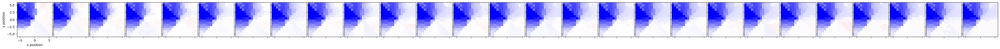

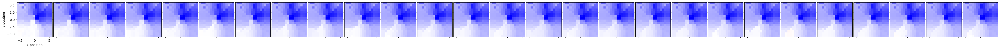

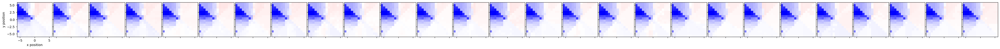

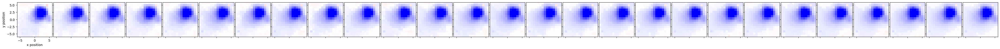

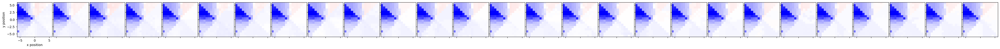

...

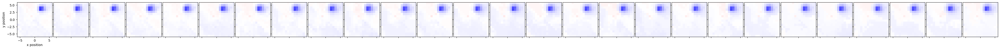

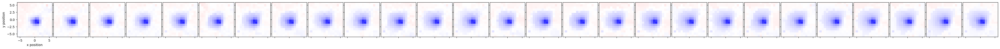

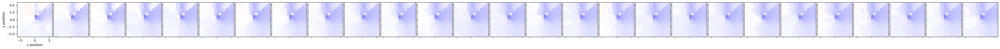

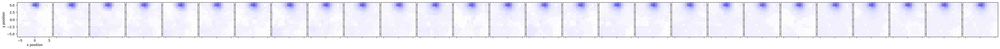

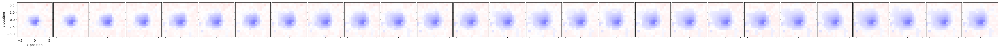

In [23]:
band = (80,120)

erp_maps = []
mean_similarity_erp = []
mean_similarity_slic = []
mean_similarity_gc = []
mean_similarity_gc_stim = []
mean_similarity_itpc = []
mean_similarity_accllr = []
mean_similarity_subject = []
mean_similarity_stim_site = []
for idx in tqdm(sort_idx[:16]):

    
    subject = implant_subj[idx]
    stim_site = implant_site[idx]
    days = implant_days[idx]
    if subject == 'affi':
        control_sites = [2, 3, 4, 16, 28, 30, 31, 32]
    else:
        control_sites = [4, 32]
    
    # Load precomputed null maps
    all_sites = aopy.data.pkl_read(
        f'{subject}_connectivity_all_sites_{version}.pkl', postproc_dir)
    long_df = load_df(postproc_dir, subject, 'rest_long', version)
    long_df = long_df[np.isin(long_df['date'], days)]
    max_trials = int(3*np.max(trial_sizes)) # enough for 3 repetitions at 500 trials
    df_long_gc = long_df[np.isin(long_df['stimulation_site'].astype(int), control_sites)].reset_index().head(max_trials)
    df_long_sub = long_df[(long_df['stimulation_site'].astype(int) == stim_site)].reset_index().head(max_trials)
    min_len = min(len(df_long_gc), len(df_long_sub))
    if min_len < max_trials: 
        print(f'not enough trials ({min_len}) for {subject} {stim_site}')
        continue
    
    print(f'{min_len} trials for {subject} {stim_site}')
    
    mean_similarity_subject.append(subject)
    mean_similarity_stim_site.append(stim_site)
    
    # ERP
    erp_map = calc_opto_resp(df_long_sub) # use all the trials
    erp_maps.append(erp_map)
    
    erp_map = sweep_trials_erp(df_long_sub, trial_sizes)
        
    avg_maps = [np.nanmean(maps, axis=0) for maps in erp_map]
    plot_spatial_drive_maps(avg_maps, (1,len(avg_maps)), (2,2), elec_data=True, clim=(-3,3), cmap='bwr')
    filename = f'trial_sweep_erp_site_{stim_site}.svg'
    aopy.visualization.savefig(fig_dir, filename)

    ms = calc_correlation_across_cond(erp_map)
    mean_similarity_erp.append(ms)

    continue
    
    # GC
    freqs, time, gc_map = sweep_trials_gc(df_long_gc, trial_sizes, stim_site)
        
    avg_maps = [np.nanmean(maps, axis=0) for maps in gc_map]
    gc_bands = extract_band_across_maps(freqs, time, avg_maps, band=band)
    plot_spatial_drive_maps(gc_bands, (1,len(gc_bands)), (2,2), elec_data=True, clim=(0,0.03), cmap='viridis')
    filename = f'trial_sweep_granger_site_{stim_site}.svg'
    aopy.visualization.savefig(fig_dir, filename)

    ms = calc_correlation_across_cond(gc_map, freqs, time, band=band)
    mean_similarity_gc.append(ms)
    
    # GC with stim
    freqs, time, gc_map = sweep_trials_gc(df_long_sub, trial_sizes, stim_site)
        
    avg_maps = [np.nanmean(maps, axis=0) for maps in gc_map]
    gc_bands = extract_band_across_maps(freqs, time, avg_maps, band=band)
    plot_spatial_drive_maps(gc_bands, (1,len(gc_bands)), (2,2), elec_data=True, clim=(0,0.03), cmap='viridis')
    filename = f'trial_sweep_granger_stim_site_{stim_site}.svg'
    aopy.visualization.savefig(fig_dir, filename)

    ms = calc_correlation_across_cond(gc_map, freqs, time, band=band)
    mean_similarity_gc_stim.append(ms)
    
    # SLIC
    freqs, time, coh_map = sweep_trials_slic(df_long_sub, trial_sizes)

    avg_maps = [np.nanmean(maps, axis=0) for maps in coh_map]
    coh_bands = extract_band_across_maps(freqs, time, avg_maps, band=band)
    plot_spatial_drive_maps(coh_bands, (1,len(coh_bands)), (2,2), elec_data=True, clim=(0,0.1), cmap='viridis')
    filename = f'trial_sweep_slic_site_{stim_site}.svg'
    aopy.visualization.savefig(fig_dir, filename)

    ms = calc_correlation_across_cond(coh_map, freqs, time, band=band)
    mean_similarity_slic.append(ms)

    # ITPC
    itpc_null = all_sites['itpc_null_maps'][stim_site-1]
    conn_map = sweep_trials_itpc(df_long_sub, trial_sizes, itpc_null)

    avg_maps = [np.nanmean(maps, axis=0) for maps in conn_map]
    plot_spatial_drive_maps(avg_maps, (1,len(avg_maps)), (2,2), elec_data=True, clim=(0,1), cmap='viridis')
    filename = f'trial_sweep_itpc_site_{stim_site}.svg'
    aopy.visualization.savefig(fig_dir, filename)

    ms = calc_correlation_across_cond(conn_map)
    mean_similarity_itpc.append(ms)
    
    # AccLLR
    conn_map = sweep_trials_accllr(df_long_sub, trial_sizes)

    avg_maps = [np.nanmean(maps, axis=0) for maps in conn_map]
    plot_spatial_drive_maps(avg_maps, (1,len(avg_maps)), (2,2), elec_data=True, clim=(0,1), cmap='viridis')
    filename = f'trial_sweep_accllr_site_{stim_site}.svg'
    aopy.visualization.savefig(fig_dir, filename)

    ms = calc_correlation_across_cond(conn_map)
    mean_similarity_accllr.append(ms)
    

In [19]:
# Note, changed from mean similarity at each trial size
# to all similarity pairs at each trial size
print('done')

done


In [15]:
# Save everything in a pickle
data = {
    'trial_sizes': trial_sizes, 
    'subject': mean_similarity_subject,
    'stim_site': mean_similarity_stim_site,
    'accllr': mean_similarity_accllr,
    'itpc': mean_similarity_itpc,
    'gc': mean_similarity_gc,
    'gc_stim': mean_similarity_gc_stim,
    'slic': mean_similarity_slic,
    'erp': erp_maps,
}
aopy.data.pkl_write(f'trial_sz_{version}.pkl', data, postproc_dir)

In [27]:
data = aopy.data.pkl_read(f'trial_sz_{version}.pkl', postproc_dir)
print('done')

done


In [26]:
data['erp'] = mean_similarity_erp
data['erp_all'] = erp_maps
data['trial_sizes'] = trial_sizes
aopy.data.pkl_write(f'trial_sz_{version}.pkl', data, postproc_dir)

In [33]:
print('d')

d


## Metric comparison

In [18]:
# Compute within/across SLIC/Granger for all sites
elec_pos, acq_ch, _ = aopy.data.load_chmap(theta=0)
n_bootstraps = 30

pool = mp.Pool(10) # mp.cpu_count()//2)
for subject, rest_df in zip(['beignet', 'affi'], [b_rest_df, a_rest_df]):
    
    filename = os.path.join(postproc_dir, 
                            f'{subject}_metric_comparison_bootstrap_{version}.pkl')
    # if os.path.exists(filename):
    #     print(f"file already exists for {subject}")
    #     continue
    
    all_sites = aopy.data.pkl_read(
        f'{subject}_connectivity_all_sites_{version}.pkl',
        postproc_dir)

    volume, p = calc_volume(all_sites['erp_map'], all_sites['erp_null_maps'])
    
    null_sites = params[subject]['null_sites']
    stim_sites = all_sites['sites'][p <= alpha]
    site_dists = []
    site_corr_mats = []
    site_dprime = []
    for stim_site in tqdm(stim_sites, desc='site'):

        df = rest_df[rest_df['stimulation_site'].astype(int) == stim_site].reset_index()
        df_slic = df.copy()
        df_gstim = df.copy()
        df_gc = rest_df[np.isin(rest_df['stimulation_site'].astype(int), null_sites)].reset_index()
        df_slic['condition'] = '0_slic'
        df_gstim['condition'] = '1_gstim'
        df_gc['condition'] = '2_granger'
        df = pd.concat([df_slic, df_gstim, df_gc])
        df, num = make_equal_sizes(df)

        slic_stat = get_connectivity_statistic(stim_site, method='slic')
        gstim_stat = get_connectivity_statistic(stim_site, method='granger')
        gc_stat = get_connectivity_statistic(stim_site, method='granger')

        dists, conditions, corr_mats, dprime = \
            compare_conditions_bootstrap_spatial_corr(
                df, elec_pos, df['condition'].to_numpy(), n_trials=len(df)//6, n_bootstraps=n_bootstraps, 
                statistics=[slic_stat, gstim_stat, gc_stat], parallel=pool
            )
        
        site_dists.append(dists)
        site_corr_mats.append(corr_mats)
        site_dprime.append(dprime)
    
    # Save data
    subj_data = {
        'stim_sites': stim_sites,
        'site_dists': site_dists,
        'conditions': conditions,
        'site_corr_mats': site_corr_mats,
        'site_dprime': site_dprime
    }

    aopy.data.pkl_write(f'{subject}_metric_comparison_bootstrap_{version}.pkl',
                       subj_data,
                       postproc_dir)
pool.close()

site:   0%|          | 0/17 [00:00<?, ?it/s]

Before: 709 trials for 2_granger, 354 trials for 0_slic, 354 trials for 1_gstim
After: 354 trials for 0_slic, 354 trials for 1_gstim, 354 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Exception in thread Thread-5:
Traceback (most recent call last):
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/tqdm/_monitor.py", line 84, in run
    instance.refresh(nolock=True)
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/tqdm/std.py", line 1347, in refresh
    self.display()
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/tqdm/notebook.py", line 171, in display
    rtext.value = right
    ^^^^^^^^^^^
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/traitlets/traitlets.py", line 716, in __set__
    self.set(obj, value)
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/traitlets/traitlets.py", line 706, in set
    obj._notify_trait(self.name, old_value,

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 709 trials for 2_granger, 350 trials for 0_slic, 350 trials for 1_gstim
After: 350 trials for 0_slic, 350 trials for 1_gstim, 350 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 709 trials for 2_granger, 351 trials for 0_slic, 351 trials for 1_gstim
After: 351 trials for 0_slic, 351 trials for 1_gstim, 351 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 709 trials for 2_granger, 359 trials for 0_slic, 359 trials for 1_gstim
After: 359 trials for 0_slic, 359 trials for 1_gstim, 359 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 709 trials for 2_granger, 351 trials for 0_slic, 351 trials for 1_gstim
After: 351 trials for 0_slic, 351 trials for 1_gstim, 351 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 709 trials for 2_granger, 351 trials for 0_slic, 351 trials for 1_gstim
After: 351 trials for 0_slic, 351 trials for 1_gstim, 351 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 709 trials for 2_granger, 350 trials for 0_slic, 350 trials for 1_gstim
After: 350 trials for 0_slic, 350 trials for 1_gstim, 350 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 709 trials for 2_granger, 351 trials for 0_slic, 351 trials for 1_gstim
After: 351 trials for 0_slic, 351 trials for 1_gstim, 351 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 709 trials for 2_granger, 350 trials for 0_slic, 350 trials for 1_gstim
After: 350 trials for 0_slic, 350 trials for 1_gstim, 350 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 709 trials for 2_granger, 350 trials for 0_slic, 350 trials for 1_gstim
After: 350 trials for 0_slic, 350 trials for 1_gstim, 350 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 709 trials for 2_granger, 350 trials for 0_slic, 350 trials for 1_gstim
After: 350 trials for 0_slic, 350 trials for 1_gstim, 350 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 709 trials for 2_granger, 353 trials for 0_slic, 353 trials for 1_gstim
After: 353 trials for 0_slic, 353 trials for 1_gstim, 353 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 709 trials for 2_granger, 351 trials for 0_slic, 351 trials for 1_gstim
After: 351 trials for 0_slic, 351 trials for 1_gstim, 351 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]

Before: 709 trials for 2_granger, 350 trials for 0_slic, 350 trials for 1_gstim
After: 350 trials for 0_slic, 350 trials for 1_gstim, 350 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 709 trials for 2_granger, 350 trials for 0_slic, 350 trials for 1_gstim
After: 350 trials for 0_slic, 350 trials for 1_gstim, 350 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 709 trials for 2_granger, 350 trials for 0_slic, 350 trials for 1_gstim
After: 350 trials for 0_slic, 350 trials for 1_gstim, 350 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


site:   0%|          | 0/15 [00:00<?, ?it/s]

Before: 1200 trials for 2_granger, 600 trials for 0_slic, 600 trials for 1_gstim
After: 600 trials for 0_slic, 600 trials for 1_gstim, 600 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 1200 trials for 2_granger, 592 trials for 0_slic, 592 trials for 1_gstim
After: 592 trials for 0_slic, 592 trials for 1_gstim, 592 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 1200 trials for 2_granger, 600 trials for 0_slic, 600 trials for 1_gstim
After: 600 trials for 0_slic, 600 trials for 1_gstim, 600 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 1200 trials for 2_granger, 600 trials for 0_slic, 600 trials for 1_gstim
After: 600 trials for 0_slic, 600 trials for 1_gstim, 600 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 1200 trials for 2_granger, 600 trials for 0_slic, 600 trials for 1_gstim
After: 600 trials for 0_slic, 600 trials for 1_gstim, 600 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 1200 trials for 2_granger, 600 trials for 0_slic, 600 trials for 1_gstim
After: 600 trials for 0_slic, 600 trials for 1_gstim, 600 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 1200 trials for 2_granger, 600 trials for 0_slic, 600 trials for 1_gstim
After: 600 trials for 0_slic, 600 trials for 1_gstim, 600 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 1200 trials for 2_granger, 600 trials for 0_slic, 600 trials for 1_gstim
After: 600 trials for 0_slic, 600 trials for 1_gstim, 600 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 1200 trials for 2_granger, 600 trials for 0_slic, 600 trials for 1_gstim
After: 600 trials for 0_slic, 600 trials for 1_gstim, 600 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 1200 trials for 2_granger, 600 trials for 0_slic, 600 trials for 1_gstim
After: 600 trials for 0_slic, 600 trials for 1_gstim, 600 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 1200 trials for 2_granger, 600 trials for 0_slic, 600 trials for 1_gstim
After: 600 trials for 0_slic, 600 trials for 1_gstim, 600 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 1200 trials for 2_granger, 600 trials for 0_slic, 600 trials for 1_gstim
After: 600 trials for 0_slic, 600 trials for 1_gstim, 600 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 1200 trials for 2_granger, 600 trials for 0_slic, 600 trials for 1_gstim
After: 600 trials for 0_slic, 600 trials for 1_gstim, 600 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 1200 trials for 2_granger, 600 trials for 0_slic, 600 trials for 1_gstim
After: 600 trials for 0_slic, 600 trials for 1_gstim, 600 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Before: 1200 trials for 2_granger, 600 trials for 0_slic, 600 trials for 1_gstim
After: 600 trials for 0_slic, 600 trials for 1_gstim, 600 trials for 2_granger


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


In [19]:
print('done')

done


## Band specificity

In [20]:
elec_pos, acq_ch, _ = aopy.data.load_chmap(theta=0)
n_bootstraps = 30

pool = mp.Pool(10) # mp.cpu_count()//2)
for subject, rest_df in zip(['beignet', 'affi'], [b_rest_df, a_rest_df]):
    
    filename = os.path.join(postproc_dir, 
                            f'{subject}_band_comparison_bootstrap_{version}.pkl')
    if os.path.exists(filename):
        print(f"file already exists for {subject}")
        continue
    
    all_sites = aopy.data.pkl_read(
        f'{subject}_connectivity_all_sites_{version}.pkl',
        postproc_dir)

    volume, p = calc_volume(all_sites['erp_map'], all_sites['erp_null_maps'])
    
    null_sites = params[subject]['null_sites']
    stim_sites = all_sites['sites'][p <= alpha]
    slic_dists = []
    gc_stim_dists = []
    gc_dists = []
    for stim_site in tqdm(stim_sites, desc='site'):

        # Make equal trial sizes of stim and rest trials
        df_stim = rest_df[rest_df['stimulation_site'].astype(int) == stim_site].reset_index()
        df_rest = rest_df[np.isin(rest_df['stimulation_site'].astype(int), null_sites)].reset_index()
        df_stim['condition'] = 'stim'
        df_rest['condition'] = 'rest'
        df = pd.concat([df_stim, df_rest])
        df, num = make_equal_sizes(df)
        df_stim = df[df['condition'] == 'stim'].reset_index(drop=True)
        df_rest = df[df['condition'] == 'rest'].reset_index(drop=True)

        slic_stat = get_connectivity_statistic(stim_site, method='slic', band=None)
        gc_stim_stat = get_connectivity_statistic(stim_site, method='granger', band=None)
        gc_stat = get_connectivity_statistic(stim_site, method='granger', band=None)

        slic_dists_all = aopy.analysis.calc_trial_bootstraps(df_stim, n_trials=len(df_stim)//2, 
                                               n_bootstraps=n_bootstraps, 
                                               statistic=slic_stat, parallel=pool)
        gc_stim_dists_all = aopy.analysis.calc_trial_bootstraps(df_stim, n_trials=len(df_stim)//2, 
                                               n_bootstraps=n_bootstraps, 
                                               statistic=gc_stim_stat, parallel=pool)
        gc_dists_all = aopy.analysis.calc_trial_bootstraps(df_rest, n_trials=len(df_rest)//2, 
                                               n_bootstraps=n_bootstraps, 
                                               statistic=gc_stat, parallel=pool)

        gc_dists.append(gc_dists_all)
        gc_stim_dists.append(gc_stim_dists_all)
        slic_dists.append(slic_dists_all)
    
    # Save data
    subj_data = {
        'stim_sites': stim_sites,
        'slic_dists': slic_dists,
        'gc_dists': gc_dists,
        'gc_stim_dists': gc_stim_dists,
    }
    
    # Save data
    aopy.data.pkl_write(f'{subject}_band_comparison_bootstrap_{version}.pkl',
                       subj_data,
                       postproc_dir)
pool.close()

site:   0%|          | 0/17 [00:00<?, ?it/s]

Before: 709 trials for rest, 354 trials for stim
After: 354 trials for rest, 354 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 709 trials for rest, 350 trials for stim
After: 350 trials for rest, 350 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 709 trials for rest, 351 trials for stim
After: 351 trials for rest, 351 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 709 trials for rest, 359 trials for stim
After: 359 trials for rest, 359 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 709 trials for rest, 351 trials for stim
After: 351 trials for rest, 351 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 709 trials for rest, 351 trials for stim
After: 351 trials for rest, 351 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 709 trials for rest, 350 trials for stim
After: 350 trials for rest, 350 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Before: 709 trials for rest, 351 trials for stim
After: 351 trials for rest, 351 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Before: 709 trials for rest, 350 trials for stim
After: 350 trials for rest, 350 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Before: 709 trials for rest, 350 trials for stim
After: 350 trials for rest, 350 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 709 trials for rest, 350 trials for stim
After: 350 trials for rest, 350 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 709 trials for rest, 353 trials for stim
After: 353 trials for rest, 353 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 709 trials for rest, 351 trials for stim
After: 351 trials for rest, 351 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 709 trials for rest, 350 trials for stim
After: 350 trials for rest, 350 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]

Before: 709 trials for rest, 351 trials for stim
After: 351 trials for rest, 351 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 709 trials for rest, 350 trials for stim
After: 350 trials for rest, 350 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 709 trials for rest, 350 trials for stim
After: 350 trials for rest, 350 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


site:   0%|          | 0/15 [00:00<?, ?it/s]

Before: 1200 trials for rest, 600 trials for stim
After: 600 trials for rest, 600 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Before: 1200 trials for rest, 592 trials for stim
After: 592 trials for rest, 592 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 1200 trials for rest, 600 trials for stim
After: 600 trials for rest, 600 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 1200 trials for rest, 600 trials for stim
After: 600 trials for rest, 600 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Before: 1200 trials for rest, 600 trials for stim
After: 600 trials for rest, 600 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Before: 1200 trials for rest, 600 trials for stim
After: 600 trials for rest, 600 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 1200 trials for rest, 600 trials for stim
After: 600 trials for rest, 600 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 1200 trials for rest, 600 trials for stim
After: 600 trials for rest, 600 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 1200 trials for rest, 600 trials for stim
After: 600 trials for rest, 600 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 1200 trials for rest, 600 trials for stim
After: 600 trials for rest, 600 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Before: 1200 trials for rest, 600 trials for stim
After: 600 trials for rest, 600 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Before: 1200 trials for rest, 600 trials for stim
After: 600 trials for rest, 600 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Before: 1200 trials for rest, 600 trials for stim
After: 600 trials for rest, 600 trials for stim


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


Bootstraps:   0%|          | 0/30 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/spectral_connectivity/connectivity.py:1179: RuntimeWarning: invalid value encountered in log
  predictive_power = xp.log(total_power[..., xp.newaxis]) - xp.log(intrinsic_power)


## State comparison

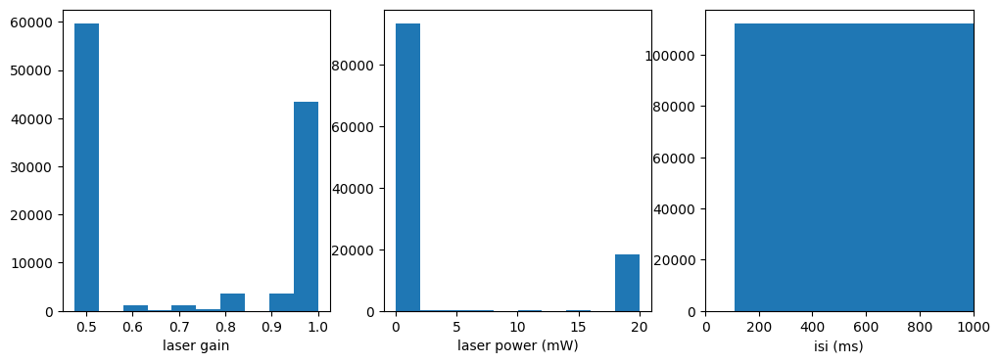

In [7]:
b_long_df = load_df(postproc_dir, 'beignet', 'rest_long', version)
trial_filter = filter_stim_trials(b_long_df, gain_range=[0.45, 0.55], min_isi=0.01)
b_long_df = b_long_df[trial_filter].reset_index()

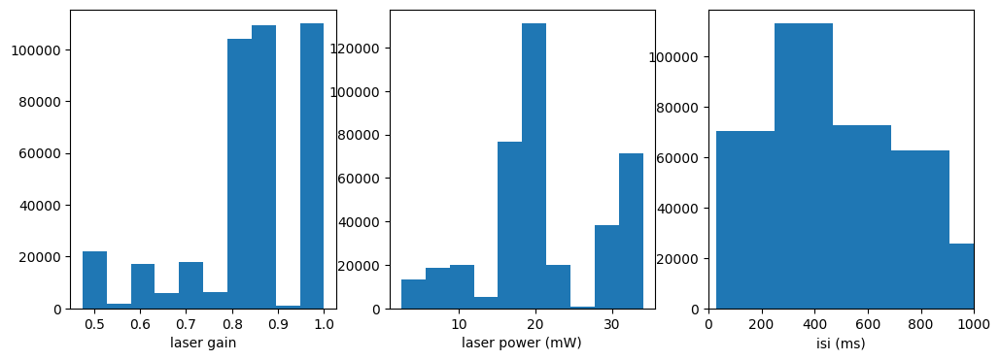

In [8]:
a_long_df = load_df(postproc_dir, 'affi', 'rest_long', version)
trial_filter = filter_stim_trials(a_long_df, min_isi=0.1)
a_long_df = a_long_df[trial_filter].reset_index()

In [15]:
n_trials = 200
n_bootstraps = 50
n_shuffle = 50

for subject, subject_data in zip(['beignet', 'affi'], [b_long_df, a_long_df]):
    
    if subject == 'beignet':
        stim_sites = [7, 11, 15]
    else:
        stim_sites = [14, 20]
    
    for stim_site in stim_sites:
        
        # Check if we've already computed this site
        filename = f'{subject}_connectivity_eyes_state_site_{stim_site}_{version}.pkl'
        filepath = os.path.join(postproc_dir, filename)
        if os.path.exists(filepath):
            print(f'file already exists for site {stim_site}')
            # continue
            
            site_data = aopy.data.pkl_read(f'{subject}_connectivity_eyes_state_site_{stim_site}_{version}.pkl',
                               postproc_dir)
            
            if 'shuff_dists1' in site_data:
                print(f'shuffled distributions already exists for site {stim_site}')
                # continue


        # Subselect trials 
        df = subject_data[(subject_data['stimulation_site'].astype(int) == stim_site)].reset_index().reset_index(drop=True)
        print(f"{len(df)} total trials for site {stim_site}")

        # Get eye masks
        eyes_open_trials, eyes_closed_trials = get_open_closed_mask(preproc_dir, df)

        df_closed = df.iloc[eyes_closed_trials].reset_index(drop=True)
        if len(df_closed) > 500:
            df_closed = df_closed.sample(500)
        df_closed['condition'] = 'closed'
        df_open = df.iloc[eyes_open_trials].reset_index(drop=True)
        if len(df_open) > 500:
            df_open = df_open.sample(500)
        df_open['condition'] = 'open'
        df = pd.concat([df_open, df_closed]).reset_index(drop=True)
        df, num = make_equal_sizes(df)
        
        # Remove outlier trials
        elec_pos, acq_ch, elecs = aopy.data.load_chmap()
        bad_trials = get_bad_stim_trials(df, channels=acq_ch-1, debug=False)
        
        df = df[~bad_trials]
        df, num = make_equal_sizes(df)
        
        pool = mp.Pool(mp.cpu_count()//2)
        stat = get_connectivity_statistic(stim_site, 'slic', parallel=False)
        labels = df['condition'].to_numpy()

        (observed_dists, conditions, observed_corr, observed_dprime, 
             shuff_dists_dist, shuff_corr_dist, shuff_dprimes
        ) = compare_conditions_bootstrap_spatial_corr(
            df, elec_pos, labels, 
            n_trials=n_trials, n_bootstraps=n_bootstraps, n_shuffle=n_shuffle, 
            statistics=stat, parallel=pool
        )
        mean1 = stat(df.iloc[labels == conditions[0]].reset_index(drop=True))
        mean2 = stat(df.iloc[labels == conditions[1]].reset_index(drop=True))
        dist1 = observed_dists[0]
        dist2 = observed_dists[1]
        shuff_dists1 = [s[0] for s in shuff_dists_dist]
        shuff_dists2 = [s[1] for s in shuff_dists_dist]
        
        pool.close()
        
        # Save data
        site_data = {
            'site': stim_site,
            'mean1': mean1,
            'mean2': mean2,
            'dist1': dist1,
            'dist2': dist2,
            'coeff': observed_corr,
            'observed_dprime': observed_dprime,
            'shuff_dists1': shuff_dists1,
            'shuff_dists2': shuff_dists2,
            'shuff_dprime': shuff_dprimes,
        }

        aopy.data.pkl_write(f'{subject}_connectivity_eyes_state_site_{stim_site}_{version}.pkl',
                               site_data,
                               postproc_dir)


4042 total trials for site 7


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/data/base.py:165: UserWarning: Preprocessing errors found in preproc_2022-02-15_beignet_3992_exp.hdf:
[b"Number of sync events (702) doesn't match number of bmi3d events (701)."
 b'No hdf task data found! Attempted to reconstruct from sync data']
  warnings.warn(f"Preprocessing errors found in {filename}:\n{metadata['preproc_errors']}")


3692 open, 349 closed (4042 total)
Before: 500 trials for open, 349 trials for closed
After: 349 trials for closed, 349 trials for open


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Before: 349 trials for closed, 348 trials for open
After: 348 trials for closed, 348 trials for open


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

12701 total trials for site 11


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/data/base.py:165: UserWarning: Preprocessing errors found in preproc_2022-02-15_beignet_3993_exp.hdf:
[b"Number of sync events (711) doesn't match number of bmi3d events (710)."
 b'No hdf task data found! Attempted to reconstruct from sync data']
  warnings.warn(f"Preprocessing errors found in {filename}:\n{metadata['preproc_errors']}")


11697 open, 962 closed (12701 total)
Before: 500 trials for open, 500 trials for closed
After: 500 trials for closed, 500 trials for open


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Before: 500 trials for open, 481 trials for closed
After: 481 trials for closed, 481 trials for open


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Exception in thread Thread-8:
Traceback (most recent call last):
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/tqdm/_monitor.py", line 84, in run
    instance.refresh(nolock=True)
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/tqdm/std.py", line 1347, in refresh
    self.display()
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/tqdm/notebook.py", line 171, in display
    rtext.value = right
    ^^^^^^^^^^^
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/traitlets/traitlets.py", line 716, in __set__
    self.set(obj, value)
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/traitlets/traitlets.py", line 706, in set
    obj._notify_trait(self.name, old_value,

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

7272 total trials for site 15


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/data/base.py:165: UserWarning: Preprocessing errors found in preproc_2022-02-15_beignet_3994_exp.hdf:
[b"Number of sync events (704) doesn't match number of bmi3d events (703)."
 b'No hdf task data found! Attempted to reconstruct from sync data']
  warnings.warn(f"Preprocessing errors found in {filename}:\n{metadata['preproc_errors']}")


6774 open, 485 closed (7272 total)
Before: 500 trials for open, 485 trials for closed
After: 485 trials for closed, 485 trials for open


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Before: 485 trials for open, 473 trials for closed
After: 473 trials for closed, 473 trials for open


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

15849 total trials for site 14


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/data/base.py:165: UserWarning: Preprocessing errors found in preproc_2023-03-21_affi_8813_exp.hdf:
[b'No hdf task data found! Attempted to reconstruct from sync data']
  warnings.warn(f"Preprocessing errors found in {filename}:\n{metadata['preproc_errors']}")


14029 open, 1599 closed (15849 total)
Before: 500 trials for open, 500 trials for closed
After: 500 trials for closed, 500 trials for open


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Before: 500 trials for closed, 500 trials for open
After: 500 trials for closed, 500 trials for open


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

37215 total trials for site 20


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/data/base.py:165: UserWarning: Preprocessing errors found in preproc_2023-03-24_affi_8903_exp.hdf:
[b'No hdf task data found! Attempted to reconstruct from sync data']
  warnings.warn(f"Preprocessing errors found in {filename}:\n{metadata['preproc_errors']}")


27922 open, 8814 closed (37215 total)
Before: 500 trials for open, 500 trials for closed
After: 500 trials for closed, 500 trials for open


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Before: 500 trials for open, 498 trials for closed
After: 498 trials for closed, 498 trials for open


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/50 [00:00<?, ?it/s]

In [30]:
display(df)

,level_0,index,subject,te_id,date,trial_time,trial_width,trial_gain,trial_power,stimulation_site,drmap_chamber,drmap_drive_type,isi,condition
0,291565,293449,affi,15903,2024-04-01,102.43704,0.02996,1.00,31.353204,20,LM1,ECoG244,0.99740,closed
1,287488,289362,affi,15854,2024-03-30,172.83080,0.00296,1.00,31.992228,20,LM1,ECoG244,0.50000,closed
2,284055,285918,affi,15770,2024-03-27,72.49144,0.02992,1.00,31.353204,20,LM1,ECoG244,0.69696,closed
3,284837,286703,affi,15786,2024-03-28,10.37312,0.02996,1.00,31.186502,20,LM1,ECoG244,1.10176,closed
4,287490,289364,affi,15854,2024-03-30,174.13100,0.00996,1.00,31.742175,20,LM1,ECoG244,0.69824,closed
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1983,246171,247909,affi,13144,2023-12-29,80.44728,0.02992,0.85,21.128815,20,LM1,ECoG244,1.91272,open
1984,246308,248046,affi,13144,2023-12-29,175.33292,0.00300,0.85,21.517787,20,LM1,ECoG244,0.20088,open
1985,28930,29929,affi,9150,2023-04-11,133.46504,0.00200,0.60,7.459252,20,LM1,ECoG244,1.10016,open
1986,56445,57543,affi,9853,2023-06-30,9.57736,0.09996,0.80,18.406016,20,LM1,ECoG244,0.31072,open


In [ ]:
# Repeat using granger
for subject, subject_data in zip(['beignet', 'affi'], [b_null_df, a_null_df]):
    
    # Get eye masks (targeting roughly 1000 trials in each group)
    if subject == 'beignet':
        df = subject_data.head(20000)
        stim_sites = [7, 11, 15]
    else:
        df = subject_data.head(5000)
        stim_sites = [14, 20]
    eyes_open_trials, eyes_closed_trials = get_open_closed_mask(preproc_dir, df)

    df_closed = df.iloc[eyes_closed_trials].reset_index(drop=True)
    df_closed['condition'] = 'closed'
    df_open = df.iloc[eyes_open_trials].reset_index(drop=True)
    df_open['condition'] = 'open'
    df = pd.concat([df_open, df_closed]).reset_index(drop=True)
    df, num = make_equal_sizes(df)

    # Remove outlier trials
    elec_pos, acq_ch, elecs = aopy.data.load_chmap()
    bad_trials = get_bad_stim_trials(df, channels=acq_ch-1, debug=False)

    df = df[~bad_trials]
    df, num = make_equal_sizes(df)

    for stim_site in tqdm(stim_sites, desc='site'):
        
        # Check if we've already computed this site
        filename = f'{subject}_gc_connectivity_eyes_state_site_{stim_site}_{version}.pkl'
        filepath = os.path.join(postproc_dir, filename)
        if os.path.exists(filepath):
            print(f'file already exists for site {stim_site}')
            # continue
                    
            site_data = aopy.data.pkl_read(f'{subject}_gc_connectivity_eyes_state_site_{stim_site}_{version}.pkl',
                               postproc_dir)

        print()
        pool = mp.Pool(10)
        stat = get_connectivity_statistic(stim_site, 'granger')
        labels = df['condition'].to_numpy()

        (observed_dists, conditions, observed_corr, observed_dprime, 
             shuff_dists_dist, shuff_corr_dist, shuff_dprimes
        ) = compare_conditions_bootstrap_spatial_corr(
            df, elec_pos, labels, 
            n_trials=n_trials, n_bootstraps=n_bootstraps, n_shuffle=n_shuffle, 
            statistics=stat, parallel=pool
        )
        mean1 = stat(df.iloc[labels == conditions[0]].reset_index(drop=True))
        mean2 = stat(df.iloc[labels == conditions[1]].reset_index(drop=True))
        dist1 = observed_dists[0]
        dist2 = observed_dists[1]
        shuff_dists1 = [s[0] for s in shuff_dists_dist]
        shuff_dists2 = [s[1] for s in shuff_dists_dist]
        
        pool.close()
        
        # Save data
        site_data = {
            'site': stim_site,
            'mean1': mean1,
            'mean2': mean2,
            'dist1': dist1,
            'dist2': dist2,
            'coeff': observed_corr,
            'observed_dprime': observed_dprime,
            'shuff_dists1': shuff_dists1,
            'shuff_dists2': shuff_dists2,
            'shuff_dprime': shuff_dprimes,
        }

        aopy.data.pkl_write(f'{subject}_gc_connectivity_eyes_state_site_{stim_site}_{version}.pkl',
                               site_data,
                               postproc_dir)


In [ ]:
print('done')